## Lane D from 7/2022
8/14/2023 - Data generated from Lentimix Library run 2 from 7/2022
Run on 6 lanes, using Library2, Library3 barcode enrichment
Analyze global run on cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib

import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/3482209352.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.1.3 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
library = ["1660-Fosl2.752","1661-Fhl2.467","1663-Myc.989","1665-Yap1.735","1667-Atf4.1383","1671-Nfkb2.152",
           "1673-Relb.286","1676-Onecut2.2361","1811-Itga2.672","1999-Cldn4-951","2114-Lif.1890",
           "2115-Fosl1.1401","2118-Nfkb1.3737",'shRenilla']

In [5]:
tags = ["shRenilla_TGTCTAGT", "shRenilla_CATAGTCA", "shPatch_GTACTTGC", "shPatch_CCATTACT", 
        "1660-Fosl2.752_CGGGAATG", "1661-Fhl2.467_GCCTACGT", "1663-Myc.989_CTGAATCT",  "1665-Yap1.735_CGTTAGGG",
        "1667-Atf4.1383_TCTGGGGC", "1671-Nfkb2.152_CGTTCAAG", "1673-Relb.286_ACAGAGCC", 
        "1676-Onecut2.2361_TTAATTAG", "1811-Itga2.672_GCCAATCG", "1999-Cldn4-951_CGTTTCCT", 
        "2114-Lif.1890_ACACGTGA", "2115-Fosl1.1401_GGTAGGGA", "2118-Nfkb1.3737_CAGTGCAT"]

In [6]:
targetGenes = ['Fosl2', 'Fhl2', 'Myc', 'Yap1', 'Atf4', 'Nfkb2', 'Relb', 'Onecut2', 'Itga2', 'Cldn4', 'Lif', 'Fosl1', 'Nfkb1', 'Slc4a11', 'Tigit']

In [7]:
results_file = 'write/allmice.h5ad'  # the file that will store the analysis results

In [8]:
adata = sc.read_10x_h5('Lib2_LaneD_filtered_feature_bc_matrix.h5', gex_only=False)

reading Lib2_LaneD_filtered_feature_bc_matrix.h5
 (0:00:01)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
samples = list(adata[:,adata.var['feature_types']=='Antibody Capture'].var.index)

In [11]:
print(samples)

['AQ1815_B0301', 'AQ1836_B0302', 'AP1695_B0303', 'AQ1135_B0304', 'AR1166_B0305', 'AP1694_B0306']


In [12]:
# Now filter out barcodes
hashadata = adata[:,samples]
adata = adata[:,[y for y in adata.var_names if y not in samples]]

## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


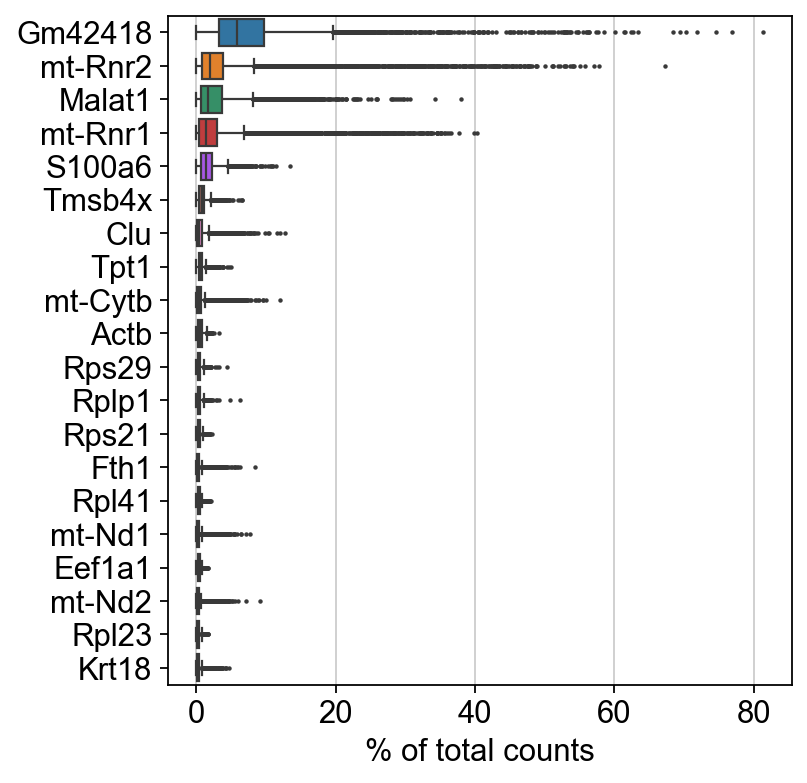

In [13]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [14]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)
#sc.pp.filter_cells(adata, min_counts=1500)

filtered out 226 cells that have less than 300 genes expressed
filtered out 28443 genes that are detected in less than 3 cells


In [15]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

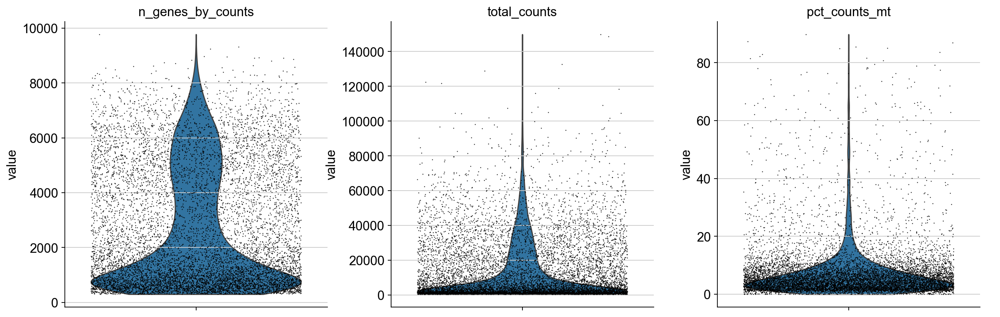

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

(array([   4.,   12.,   27.,   96.,  420., 1648., 2053., 2074., 3428.,
         246.]),
 array([0.64142646, 0.67357953, 0.7057326 , 0.73788568, 0.77003875,
        0.80219182, 0.83434489, 0.86649797, 0.89865104, 0.93080411,
        0.96295719]),
 <BarContainer object of 10 artists>)

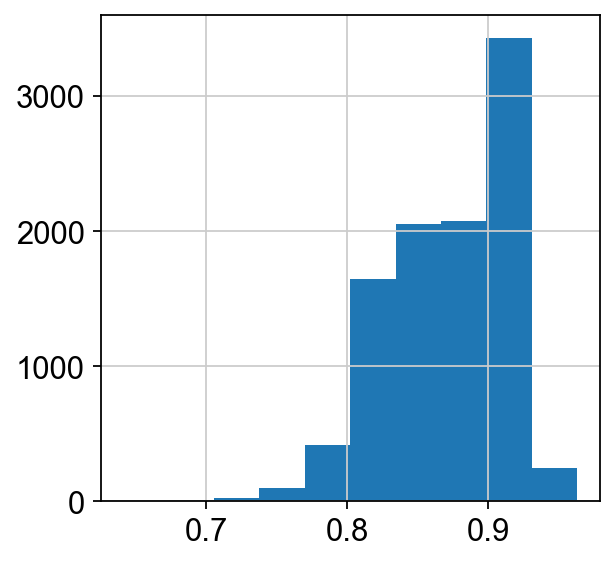

In [17]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
matplotlib.pyplot.hist(adata.obs["log10GenesPerUMI"])

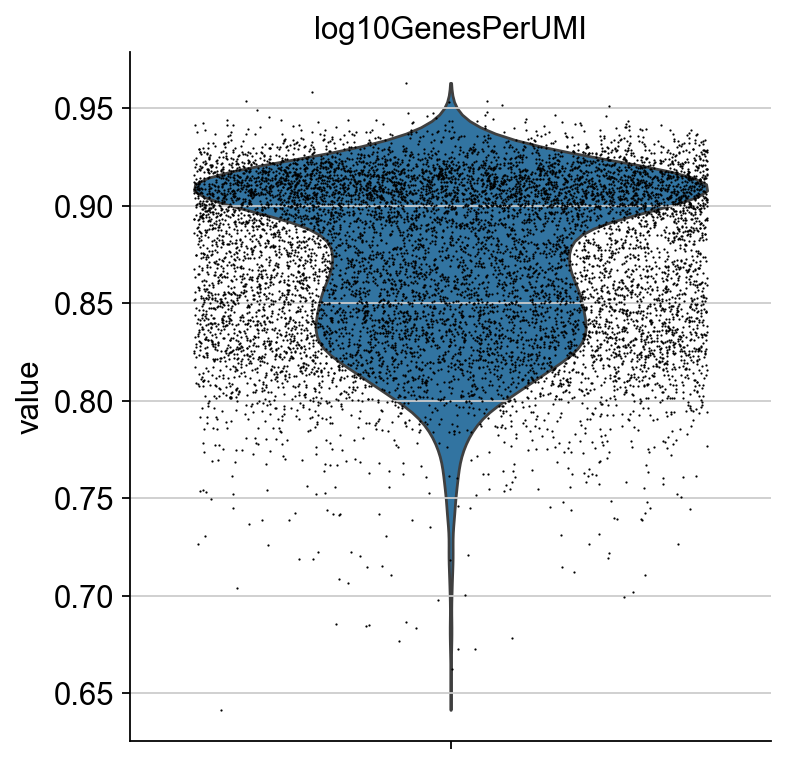

In [18]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [19]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.8,:]

In [20]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

## Run Demultiplexing

In [21]:
hashadata = hashadata[hashadata.obs.index.isin(adata.obs.index), :]

In [22]:
hashCounts = pd.DataFrame(hashadata.X.todense(), columns=hashadata.var_names, index=adata.obs.index)

In [23]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.99,0.999])
hashDisc

,AQ1815_B0301,AQ1836_B0302,AP1695_B0303,AQ1135_B0304,AR1166_B0305,AP1694_B0306
count,7898.000000,7898.000000,7898.000000,7898.000000,7898.000000,7898.000000
mean,115.391998,80.318184,28.834135,0.895290,36.799824,28.300076
std,267.191040,402.076141,235.270950,26.797777,260.712372,226.041046
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000
20%,13.000000,2.000000,0.000000,0.000000,0.000000,0.000000
30%,17.000000,3.000000,1.000000,0.000000,1.000000,0.000000
40%,22.000000,3.000000,1.000000,0.000000,1.000000,1.000000
50%,30.000000,4.000000,1.000000,0.000000,2.000000,1.000000
60%,42.000000,6.000000,2.000000,0.000000,3.000000,1.000000


In [24]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

AQ1815_B0301
328.3000000000002
AQ1836_B0302
52.0
AP1695_B0303
10.0
AQ1135_B0304
0.0
AR1166_B0305
18.0
AP1694_B0306
6.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,AQ1815_B0301,AQ1836_B0302,AP1695_B0303,AQ1135_B0304,AR1166_B0305,AP1694_B0306
AAACCCAAGCTGTTAC-1,False,True,True,False,False,False
AAACCCACAAAGTGTA-1,False,False,False,False,False,False
AAACCCACAAGGTACG-1,False,False,False,False,True,True
AAACCCACAGGCAATG-1,False,True,False,False,False,False
AAACCCACAGTTAGAA-1,False,False,False,False,True,False
...,...,...,...,...,...,...
TTTGTTGGTTCCGCTT-1,False,False,False,False,False,False
TTTGTTGGTTGGGACA-1,False,False,False,False,False,False
TTTGTTGTCACCATAG-1,False,False,False,False,True,False
TTTGTTGTCCGGCAGT-1,False,False,False,False,False,False


In [25]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [26]:
from matplotlib import pyplot as plt

In [27]:
plt.rcParams['figure.figsize'] = (4,4)

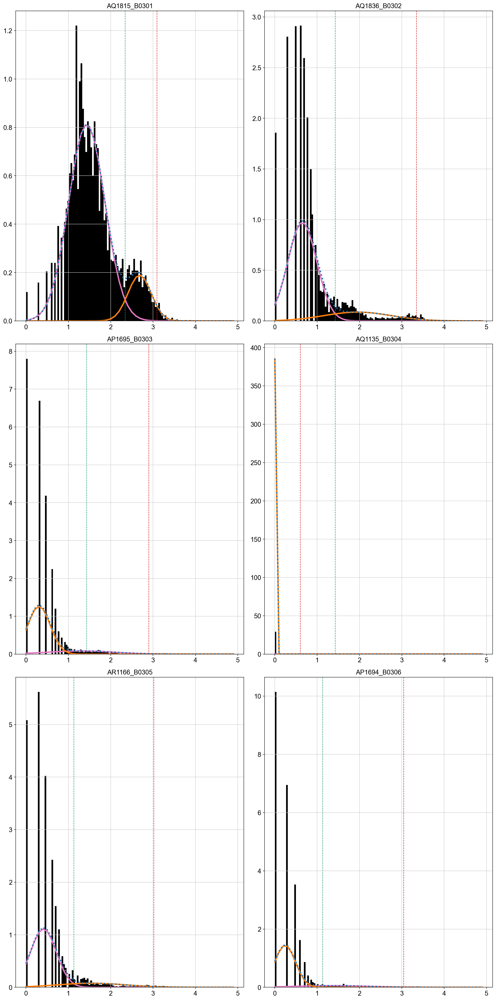

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

fig, axs = plt.subplots(3,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(hashadata.var_names)),hashadata.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(hashadata.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
        else:
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1:# and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [29]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
AQ1815_B0301,2.34
AQ1836_B0302,1.43
AP1695_B0303,1.43
AQ1135_B0304,1.43
AR1166_B0305,1.13
AP1694_B0306,1.13


In [30]:
hashCounts

,AQ1815_B0301,AQ1836_B0302,AP1695_B0303,AQ1135_B0304,AR1166_B0305,AP1694_B0306
AAACCCAAGCTGTTAC-1,69.0,94.0,87.0,0.0,5.0,1.0
AAACCCACAAAGTGTA-1,45.0,1.0,0.0,0.0,0.0,1.0
AAACCCACAAGGTACG-1,4.0,18.0,1.0,0.0,22.0,15.0
AAACCCACAGGCAATG-1,54.0,53.0,1.0,0.0,3.0,2.0
AAACCCACAGTTAGAA-1,23.0,3.0,3.0,0.0,103.0,0.0
...,...,...,...,...,...,...
TTTGTTGGTTCCGCTT-1,21.0,0.0,2.0,0.0,0.0,0.0
TTTGTTGGTTGGGACA-1,19.0,2.0,0.0,0.0,0.0,3.0
TTTGTTGTCACCATAG-1,52.0,4.0,4.0,0.0,24.0,4.0
TTTGTTGTCCGGCAGT-1,13.0,0.0,0.0,0.0,1.0,0.0


In [31]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

AQ1815_B0301
2.34
AQ1836_B0302
1.43
AP1695_B0303
1.43
AQ1135_B0304
1.43
AR1166_B0305
1.1300000000000001
AP1694_B0306
1.1300000000000001


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False  True]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/1750252066.py:6: FutureWarning: Setting an item of incomp

,AQ1815_B0301,AQ1836_B0302,AP1695_B0303,AQ1135_B0304,AR1166_B0305,AP1694_B0306
AAACCCAAGCTGTTAC-1,False,True,True,False,False,False
AAACCCACAAAGTGTA-1,False,False,False,False,False,False
AAACCCACAAGGTACG-1,False,False,False,False,True,True
AAACCCACAGGCAATG-1,False,True,False,False,False,False
AAACCCACAGTTAGAA-1,False,False,False,False,True,False
...,...,...,...,...,...,...
TTTGTTGGTTCCGCTT-1,False,False,False,False,False,False
TTTGTTGGTTGGGACA-1,False,False,False,False,False,False
TTTGTTGTCACCATAG-1,False,False,False,False,True,False
TTTGTTGTCCGGCAGT-1,False,False,False,False,False,False


In [32]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [33]:
adata.obs["Classification"] = classification
hashadata.obs["Classification"] = classification
adata.obs["Classification"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/4135005838.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Classification"] = classification
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/4135005838.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  hashadata.obs["Classification"] = classification


Classification
negative        4271
AQ1815_B0301     994
AQ1836_B0302     885
AR1166_B0305     666
doublet          504
AP1694_B0306     301
AP1695_B0303     247
AQ1135_B0304      30
Name: count, dtype: int64

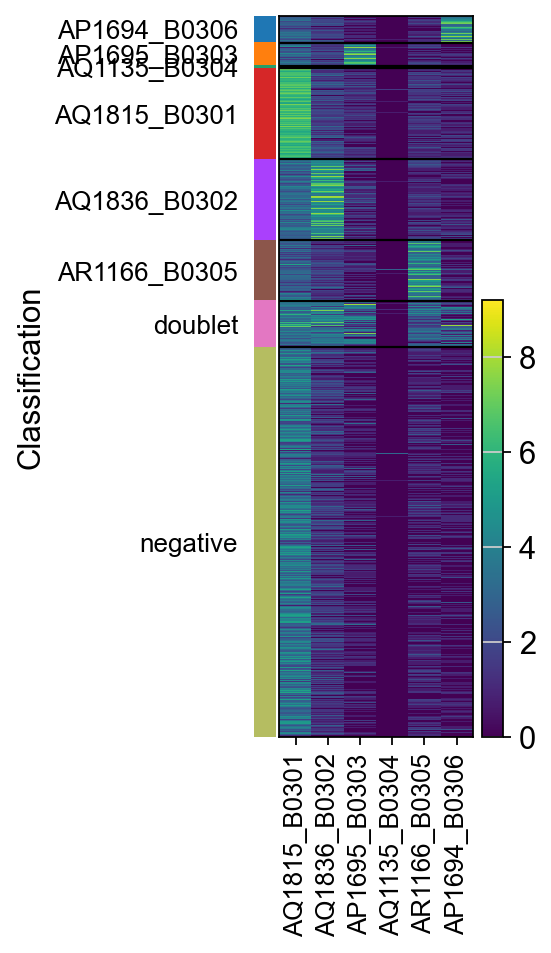

In [34]:
#output visulaization of hashing
sc.pl.heatmap(hashadata, hashadata.var_names, groupby="Classification", log=True)#, save = f"_{figName}_hash.png")

In [35]:
adata.obs.index

Index(['AAACCCAAGCTGTTAC-1', 'AAACCCACAAAGTGTA-1', 'AAACCCACAAGGTACG-1',
       'AAACCCACAGGCAATG-1', 'AAACCCACAGTTAGAA-1', 'AAACCCAGTATATGGA-1',
       'AAACCCAGTGAGAACC-1', 'AAACCCATCAAGAAAC-1', 'AAACCCATCCTATGGA-1',
       'AAACCCATCGTAGCTA-1',
       ...
       'TTTGTTGAGTCACAGG-1', 'TTTGTTGCAAAGGCGT-1', 'TTTGTTGCACCGTGCA-1',
       'TTTGTTGCATTGCCTC-1', 'TTTGTTGGTGATTAGA-1', 'TTTGTTGGTTCCGCTT-1',
       'TTTGTTGGTTGGGACA-1', 'TTTGTTGTCACCATAG-1', 'TTTGTTGTCCGGCAGT-1',
       'TTTGTTGTCTGGGCCA-1'],
      dtype='object', length=7898)

In [36]:
hashCounts = pd.DataFrame(index=adata.obs.index)

[]


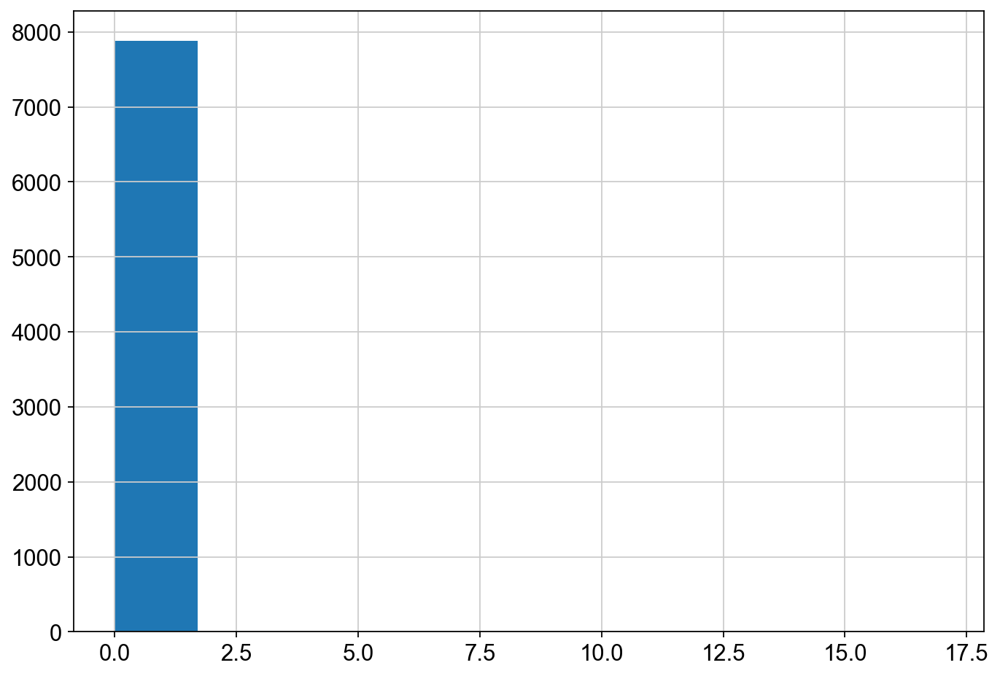

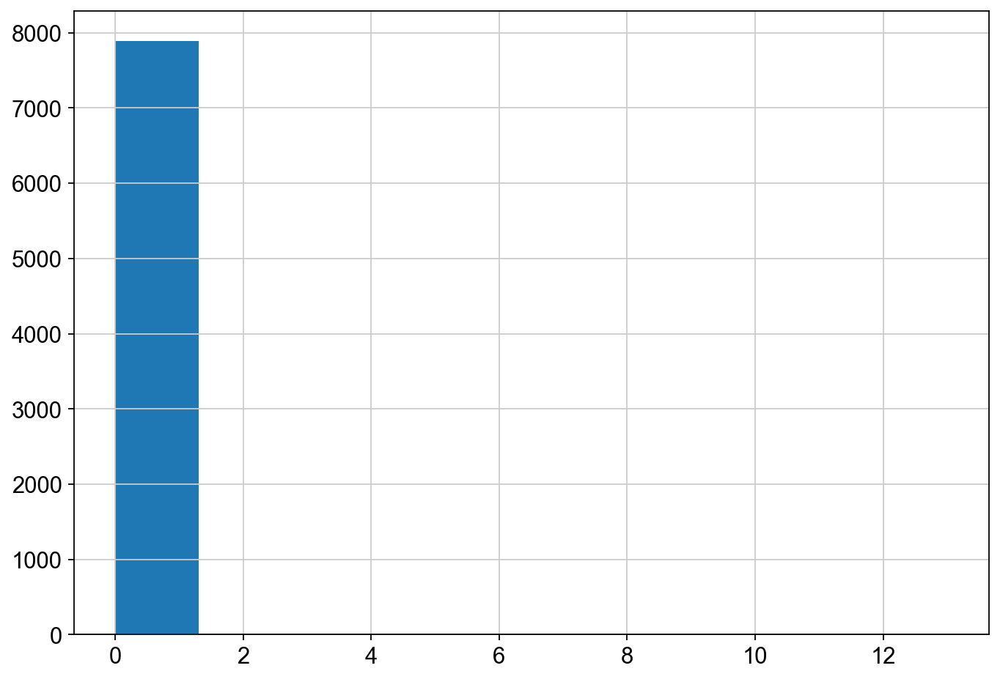

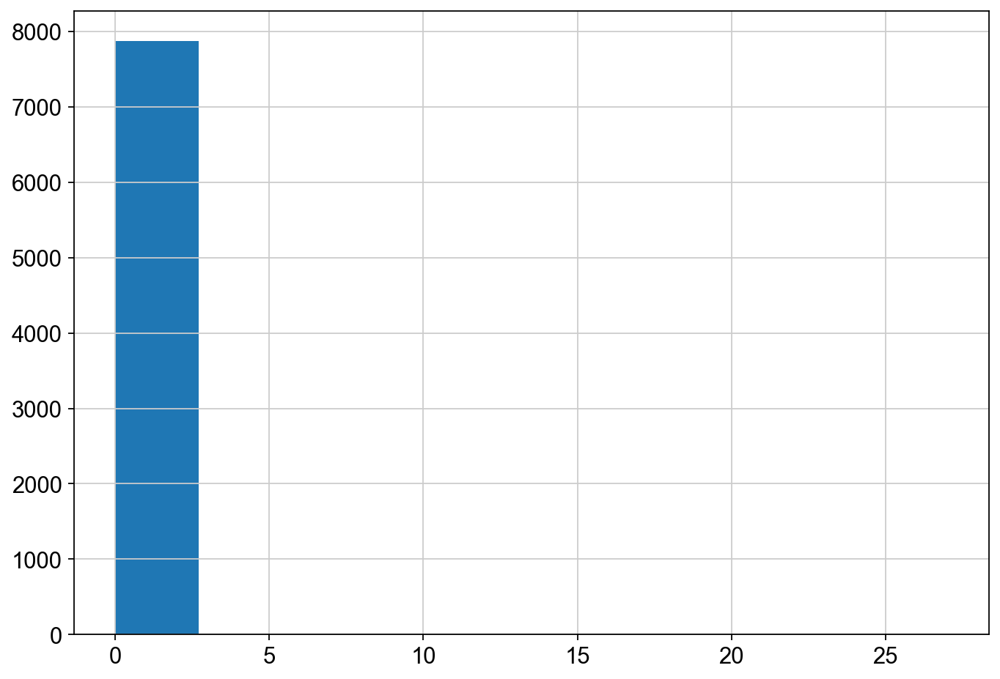

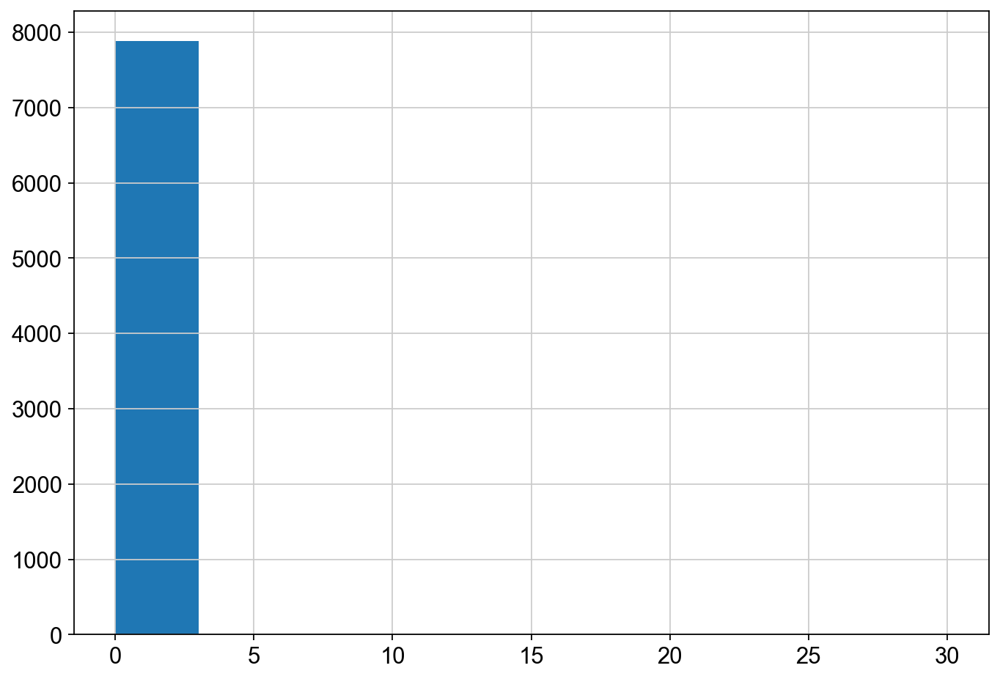

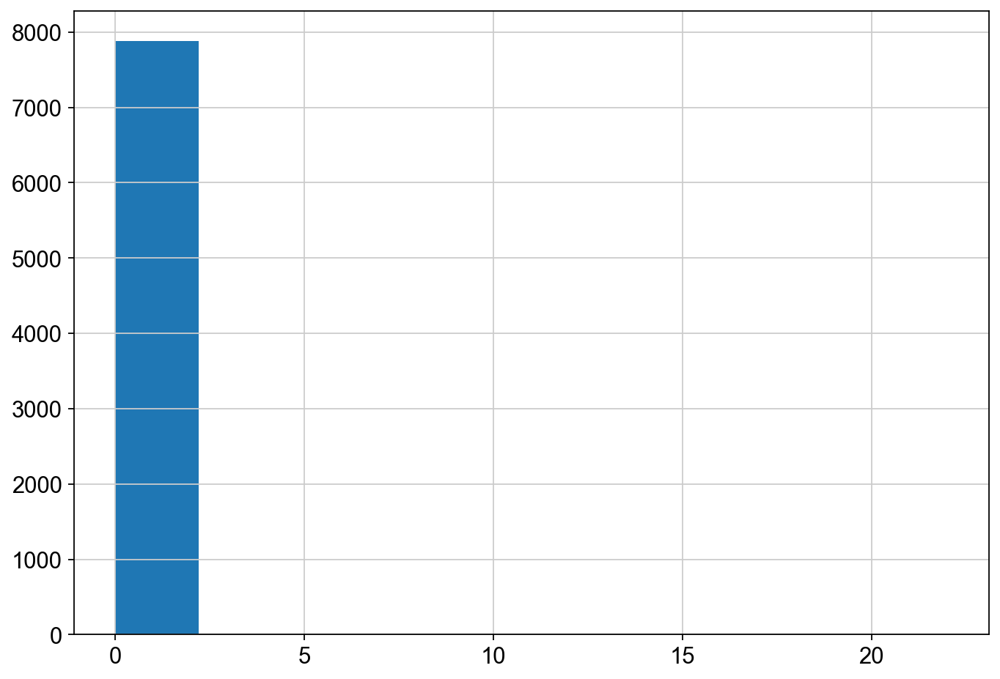

...

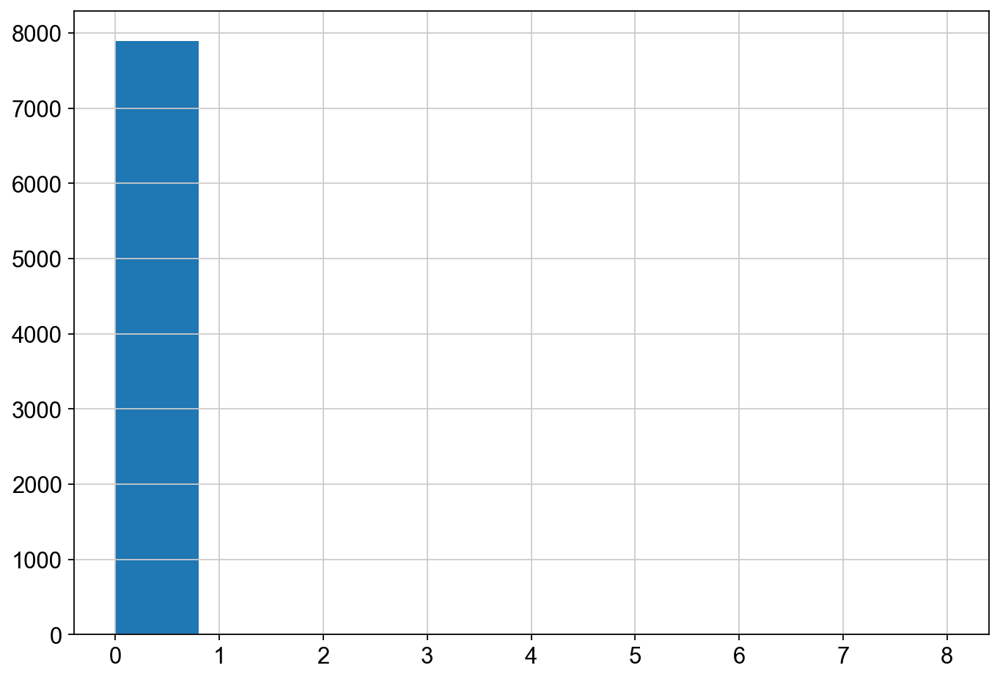

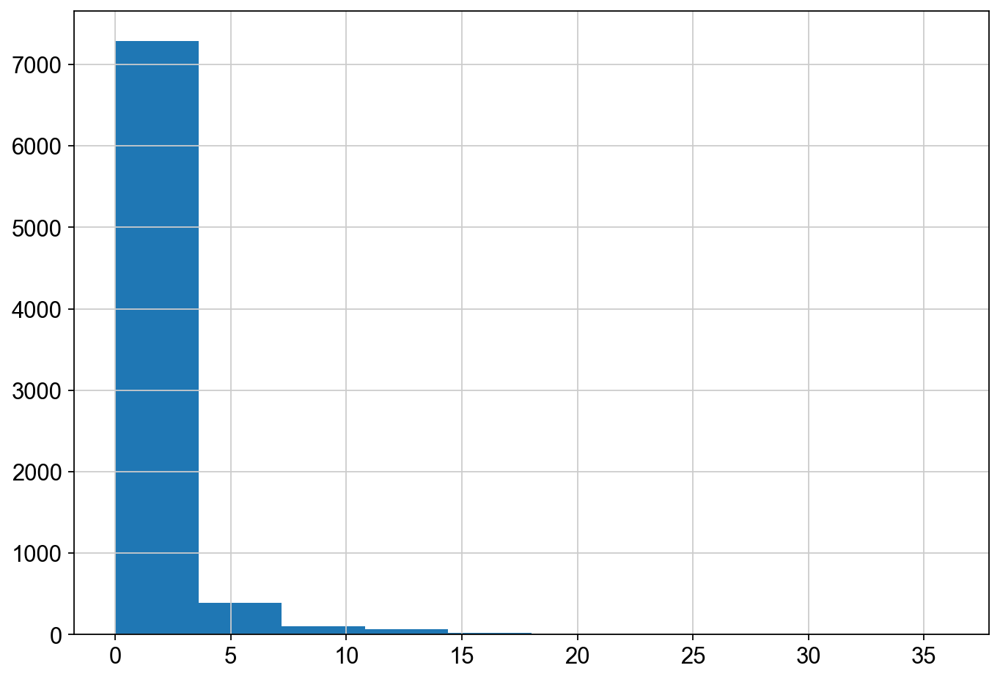

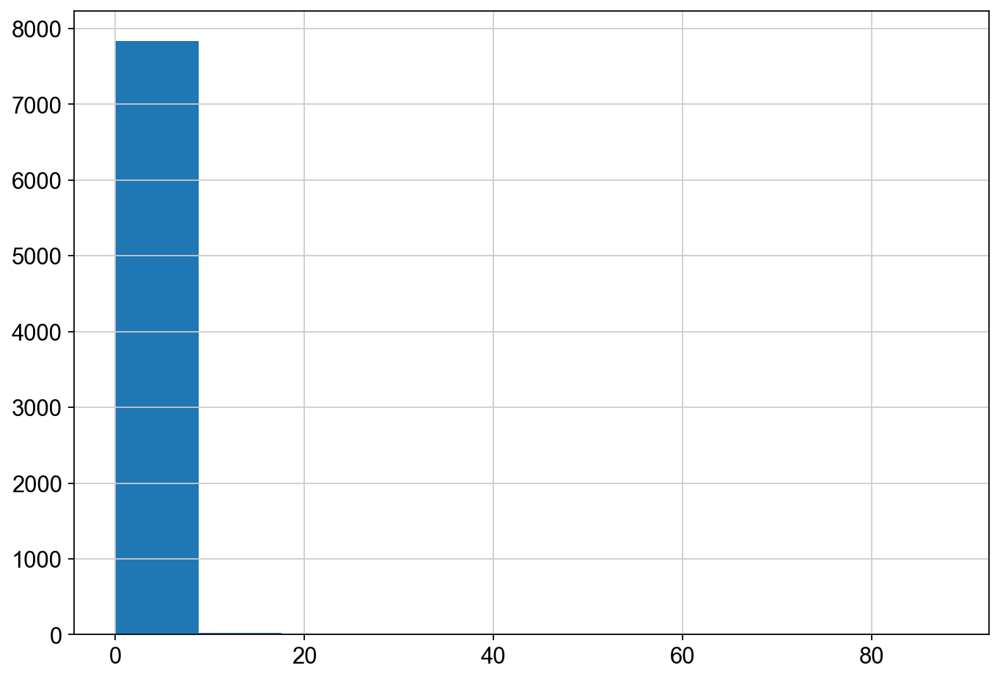

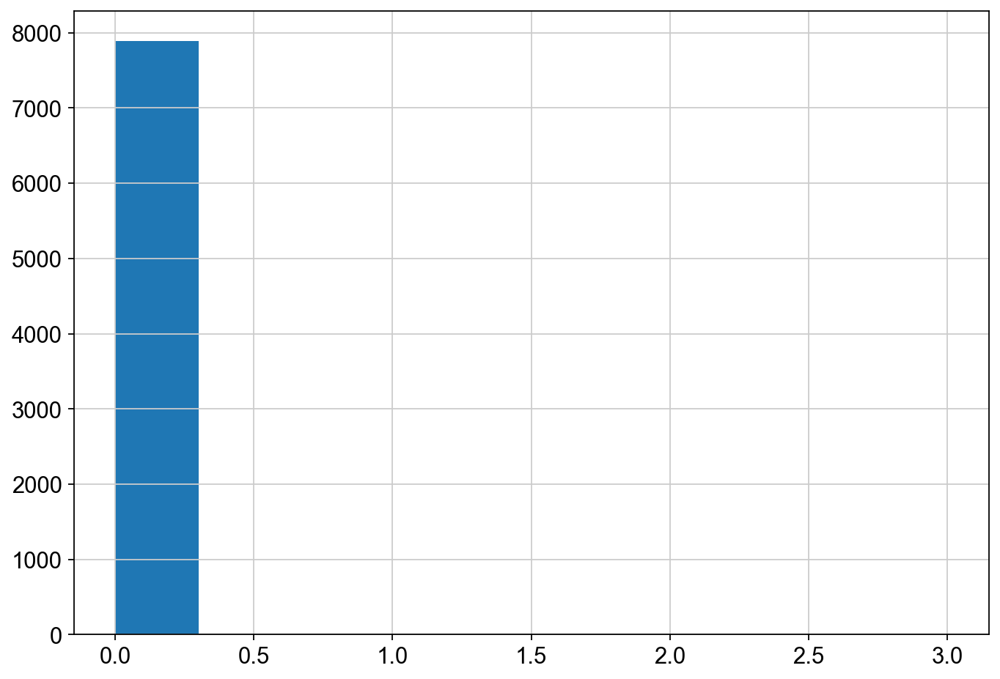

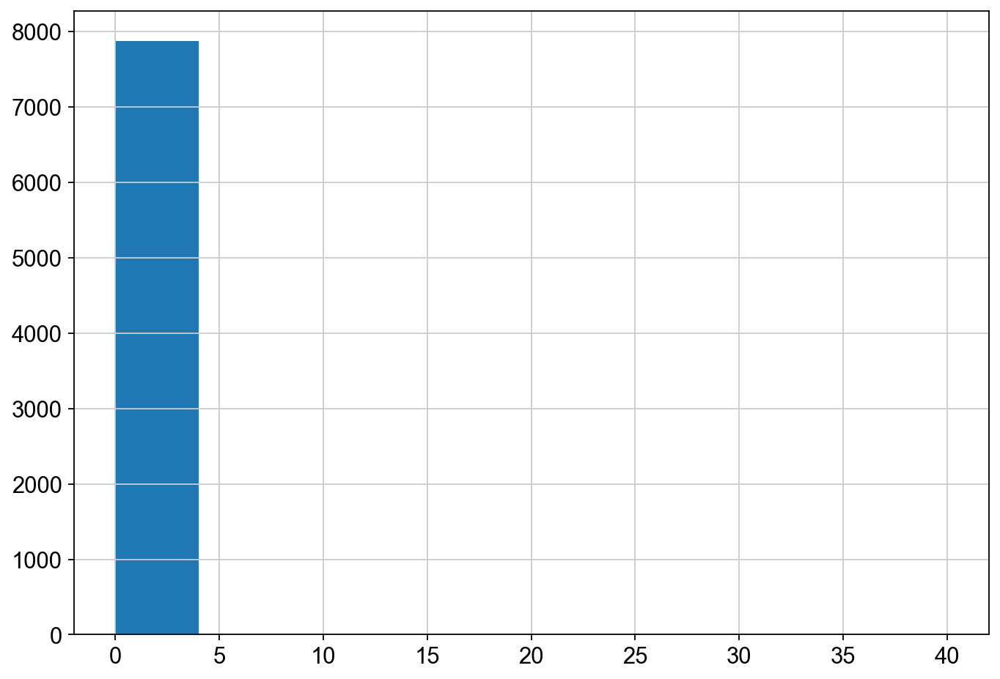

In [37]:
libraryToRemove=[]
for x in library:
    fig, ax = plt.subplots(figsize =(10, 7))
    ax.hist(adata.X[:,adata.var.index.isin([x])].toarray())
    if x not in adata.var.index:
        libraryToRemove.append(x)
        continue
    adata.obs["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
    hashCounts["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
print(libraryToRemove)
for x in libraryToRemove:
    library.remove(x)

In [38]:
hashCounts

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGCTGTTAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAAAGTGTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAAGGTACG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAGGCAATG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAGTTAGAA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTCCGCTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
TTTGTTGGTTGGGACA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0
TTTGTTGTCACCATAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCCGGCAGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


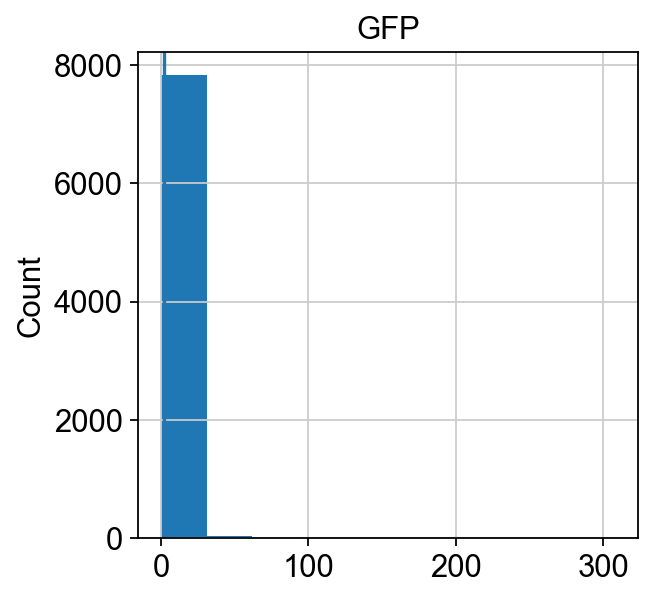

In [39]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'GFP'].X.toarray())
plt.ylabel("Count")
plt.title("GFP")
plt.axvline(x=2)
plt.show()

In [40]:
adata.obs['GFP_count'] = adata.X[:,adata.var.index.isin(['GFP'])].toarray()

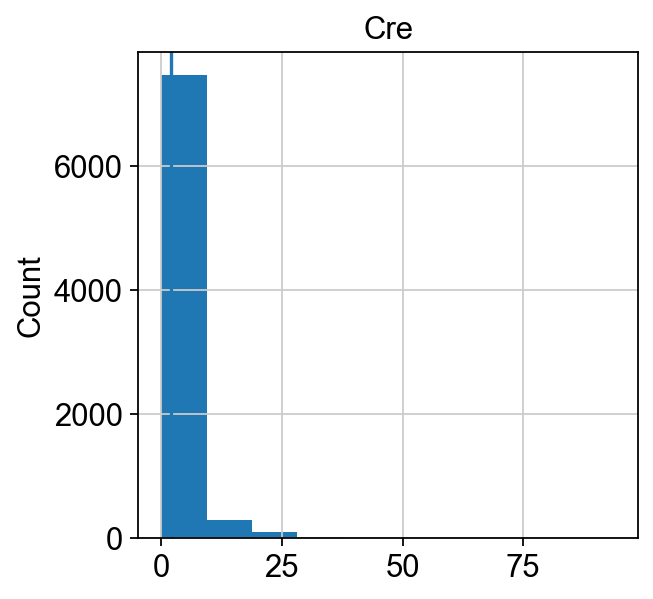

In [41]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'Cre'].X.toarray())
plt.ylabel("Count")
plt.title("Cre")
plt.axvline(x=2)
plt.show()

In [42]:
adata.obs['Cre_count'] = adata.X[:,adata.var.index.isin(['Cre'])].toarray()

## find single library read cells

In [43]:
hashIDs = hashCounts.copy()
for hashName in hashCounts.columns:
    print(hashName)
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
hashIDs

1660-Fosl2.752-library
1661-Fhl2.467-library
1663-Myc.989-library
1665-Yap1.735-library
1667-Atf4.1383-library
1671-Nfkb2.152-library
1673-Relb.286-library
1676-Onecut2.2361-library
1811-Itga2.672-library
1999-Cldn4-951-library
2114-Lif.1890-library
2115-Fosl1.1401-library
2118-Nfkb1.3737-library
shRenilla-library


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ...

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGCTGTTAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAAAGTGTA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAAGGTACG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAGGCAATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAGTTAGAA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTCCGCTT-1,False,False,False,False,False,False,False,False,False,False,True,False,False,False
TTTGTTGGTTGGGACA-1,False,False,False,False,False,False,False,False,False,False,True,False,False,False
TTTGTTGTCACCATAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCCGGCAGT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [44]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashCounts.columns[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [45]:
adata.obs["library_id"] = classification
adata.obs["library_id"].value_counts()

library_id
negative                     6439
2114-Lif.1890-library        1100
2115-Fosl1.1401-library       121
1676-Onecut2.2361-library      56
1663-Myc.989-library           33
shRenilla-library              30
1673-Relb.286-library          29
1667-Atf4.1383-library         22
1671-Nfkb2.152-library         18
1660-Fosl2.752-library         15
1665-Yap1.735-library          13
doublet                         8
1661-Fhl2.467-library           7
2118-Nfkb1.3737-library         4
1811-Itga2.672-library          2
1999-Cldn4-951-library          1
Name: count, dtype: int64

## Prune filtered cells and run hashing on extra hashtag reads

In [46]:
adata_enriched = sc.read_10x_h5('../barcodes/D/Lib2_D_BC_enriched_filtered_feature_bc_matrix.h5')

reading ../barcodes/D/Lib2_D_BC_enriched_filtered_feature_bc_matrix.h5
 (0:00:00)


In [47]:
# Find the barcodes that exist in BOTH datasets
common_indices = adata_enriched.obs.index.intersection(adata.obs.index)

# Filter the enriched data to only include those common cells and the specific tags
adata_enriched = adata_enriched[common_indices, tags]

In [48]:
hashCounts = pd.DataFrame(adata_enriched.X.todense(), columns=adata_enriched.var_names, index=adata_enriched.obs.index)
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.95,0.99,0.999])
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGCTGTTAC-1,31.0,5.0,38.0,254.0,51.0,22.0,61.0,30.0,17.0,24.0,35.0,81.0,10.0,2.0,1656.0,169.0,1.0
AAACCCACAGGCAATG-1,12.0,4.0,20.0,130.0,16.0,7.0,22.0,7.0,7.0,8.0,27.0,44.0,10.0,0.0,730.0,70.0,0.0
AAACCCAGTATATGGA-1,16.0,7.0,21.0,91.0,22.0,3.0,19.0,5.0,4.0,10.0,26.0,34.0,4.0,2.0,432.0,74.0,0.0
AAACCCATCAAGAAAC-1,9.0,0.0,11.0,72.0,15.0,2.0,14.0,9.0,6.0,6.0,16.0,24.0,1.0,0.0,465.0,58.0,1.0
AAACCCATCGTAGCTA-1,13.0,3.0,12.0,68.0,21.0,6.0,17.0,6.0,7.0,9.0,13.0,24.0,1.0,2.0,283.0,44.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACCGTGCA-1,7.0,2.0,12.0,58.0,15.0,5.0,7.0,6.0,3.0,5.0,10.0,21.0,1.0,0.0,339.0,35.0,0.0
TTTGTTGCATTGCCTC-1,17.0,5.0,19.0,107.0,17.0,7.0,22.0,9.0,11.0,10.0,21.0,34.0,3.0,3.0,595.0,60.0,1.0
TTTGTTGGTTCCGCTT-1,19.0,14.0,30.0,229.0,38.0,11.0,47.0,16.0,15.0,31.0,53.0,50.0,11.0,1.0,887.0,131.0,0.0
TTTGTTGGTTGGGACA-1,16.0,4.0,25.0,140.0,33.0,7.0,33.0,12.0,7.0,15.0,24.0,47.0,6.0,0.0,564.0,71.0,0.0


In [49]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
#hashIDs

shRenilla_TGTCTAGT
32.0
shRenilla_CATAGTCA
12.0
shPatch_GTACTTGC
44.0
shPatch_CCATTACT
243.60000000000036
1660-Fosl2.752_CGGGAATG
51.0
1661-Fhl2.467_GCCTACGT
20.0
1663-Myc.989_CTGAATCT
52.0
1665-Yap1.735_CGTTAGGG
24.0
1667-Atf4.1383_TCTGGGGC
17.0
1671-Nfkb2.152_CGTTCAAG
28.0
1673-Relb.286_ACAGAGCC
52.0
1676-Onecut2.2361_TTAATTAG
79.0
1811-Itga2.672_GCCAATCG
7.0
1999-Cldn4-951_CGTTTCCT
3.0
2114-Lif.1890_ACACGTGA
1295.0
2115-Fosl1.1401_GGTAGGGA
156.0
2118-Nfkb1.3737_CAGTGCAT
2.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ...  True False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in 

In [50]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

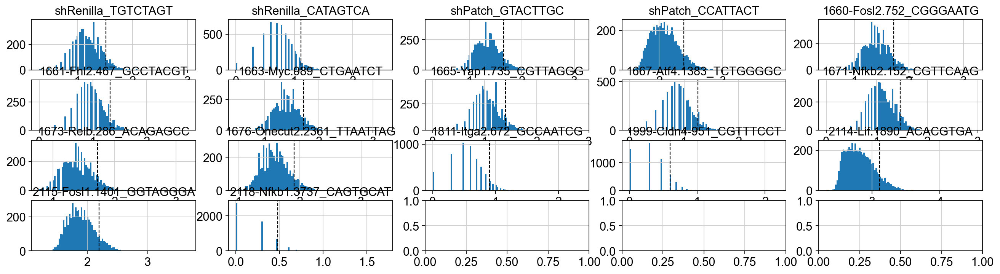

In [51]:
plt.rcParams['figure.figsize'] = (4,4)
fig, axs = plt.subplots(4,5, figsize =(20, 5))

for i, hashName in enumerate(adata_enriched.var_names):
    hashCounts2 = np.log10(hashCounts[hashName]+1)
    axs[i//5,i%5].set_title(hashName)
    axs[i//5,i%5].hist(hashCounts2, bins = 100)
    axs[i//5,i%5].axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)

#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

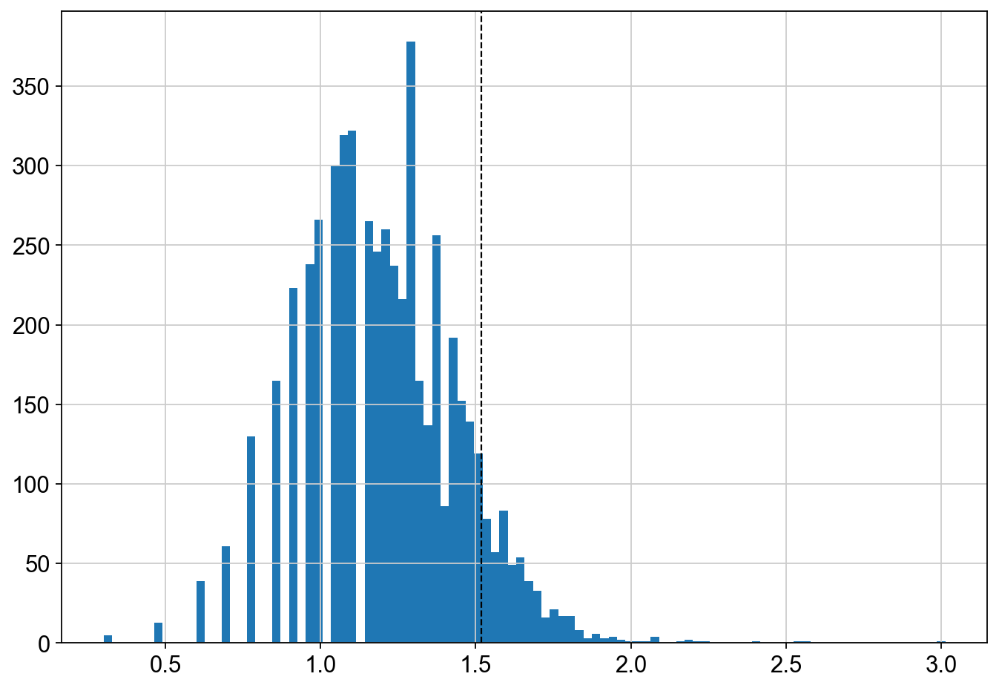

In [52]:
hashName= "shRenilla_TGTCTAGT"
hash301 = np.log10(hashCounts[hashName]+1)

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(hash301, bins = 100)
ax.axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)
# Show plot
plt.show()

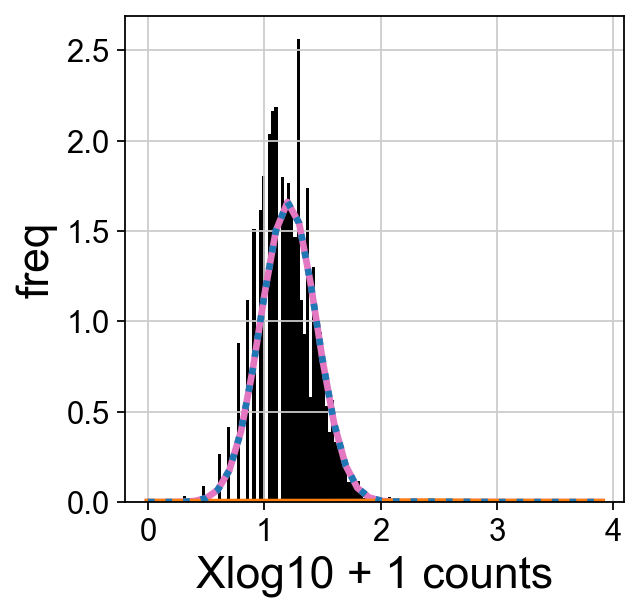

In [53]:
# import libraries (some are for cosmetics)
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

x = np.array(hash301).reshape(-1, 1)

# create GMM model object
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[3]])

# find useful parameters
fitGMM = gmm.fit(x)
mean = fitGMM.means_  
covs  = fitGMM.covariances_
weights = fitGMM.weights_

# create necessary things to plot
x_axis = np.arange(0, 4, 0.1)
y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

ax = fig.add_subplot(1,2,2)
# Plot 2
plt.hist(x, density=True, color='black', bins=100)
plt.plot(x_axis, y_axis0, lw=3, c='C6')
plt.plot(x_axis, y_axis1, lw=3, c='C1')
plt.plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')
#plt.xlim(0, 4, 0.1)
#plt.ylim(0.0, 2.0)
plt.xlabel(r"Xlog10 + 1 counts", fontsize=20)
plt.ylabel(r"freq", fontsize=20)

#plt.subplots_adjust(wspace=0.3)
plt.show()
plt.close('all')

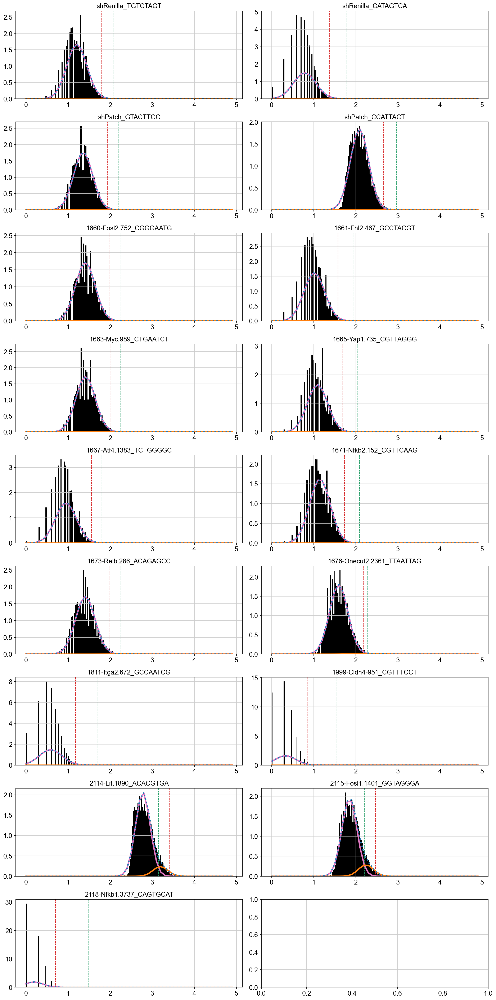

In [54]:
import pdb

fig, axs = plt.subplots(9,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(adata_enriched.var_names)),adata_enriched.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(adata_enriched.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    
    gmm = None
    if hashCount.mean() > 2:
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[2.5],[4]])
    elif hashCount.mean() > 1:
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[1.5],[3]])
    else:
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.5],[3]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["95%",hashName])+1)
        else:
            
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .80) and np.where(fitGMM.predict_proba(binEx)[:,0] < 0.2))[0][0]][0]
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1]/fitGMM.predict_proba(binEx)[:,0] > 3))[0][0]][0]

            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1: # and fitGMM.predict_proba(binEx)[x][1] > 0.8 and fitGMM.predict_proba(binEx)[x][0] < 0.2:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
#    hashBoundry = mean[0][0]+1.96*np.sqrt(float(covs[0][0][0]))
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [55]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
shRenilla_TGTCTAGT,2.090
shRenilla_CATAGTCA,1.770
shPatch_GTACTTGC,2.190
shPatch_CCATTACT,2.965
1660-Fosl2.752_CGGGAATG,2.255
1661-Fhl2.467_GCCTACGT,1.935
1663-Myc.989_CTGAATCT,2.250
1665-Yap1.735_CGTTAGGG,2.035
1667-Atf4.1383_TCTGGGGC,1.805
1671-Nfkb2.152_CGTTCAAG,2.090


In [56]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
hashIDs

shRenilla_TGTCTAGT
2.09
shRenilla_CATAGTCA
1.77
shPatch_GTACTTGC
2.19
shPatch_CCATTACT
2.965
1660-Fosl2.752_CGGGAATG
2.255
1661-Fhl2.467_GCCTACGT
1.935
1663-Myc.989_CTGAATCT
2.25
1665-Yap1.735_CGTTAGGG
2.035
1667-Atf4.1383_TCTGGGGC
1.805
1671-Nfkb2.152_CGTTCAAG
2.09
1673-Relb.286_ACAGAGCC
2.235
1676-Onecut2.2361_TTAATTAG
2.275
1811-Itga2.672_GCCAATCG
1.69
1999-Cldn4-951_CGTTTCCT
1.5350000000000001
2114-Lif.1890_ACACGTGA
3.145
2115-Fosl1.1401_GGTAGGGA
2.205
2118-Nfkb1.3737_CAGTGCAT
1.49


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/68405080.py:6: FutureWarning: Setting an item of incompatible

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGCTGTTAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False
AAACCCACAGGCAATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAGTATATGGA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCAAGAAAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCGTAGCTA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACCGTGCA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGCATTGCCTC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTTCCGCTT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTTGGGACA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [57]:
classification = np.empty(len(adata_enriched), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [58]:
adata_enriched.obs['Library'] = classification
adata.obs["Library"] = adata_enriched.obs['Library']
adata.obs["Library"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2727749959.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_enriched.obs['Library'] = classification


Library
negative                      4776
doublet                        354
2115-Fosl1.1401_GGTAGGGA       162
2114-Lif.1890_ACACGTGA          88
1667-Atf4.1383_TCTGGGGC          9
1676-Onecut2.2361_TTAATTAG       6
shPatch_GTACTTGC                 5
shRenilla_CATAGTCA               5
1673-Relb.286_ACAGAGCC           5
shRenilla_TGTCTAGT               5
1661-Fhl2.467_GCCTACGT           5
1665-Yap1.735_CGTTAGGG           3
1811-Itga2.672_GCCAATCG          3
1999-Cldn4-951_CGTTTCCT          2
1660-Fosl2.752_CGGGAATG          2
1671-Nfkb2.152_CGTTCAAG          2
1663-Myc.989_CTGAATCT            2
2118-Nfkb1.3737_CAGTGCAT         1
Name: count, dtype: int64

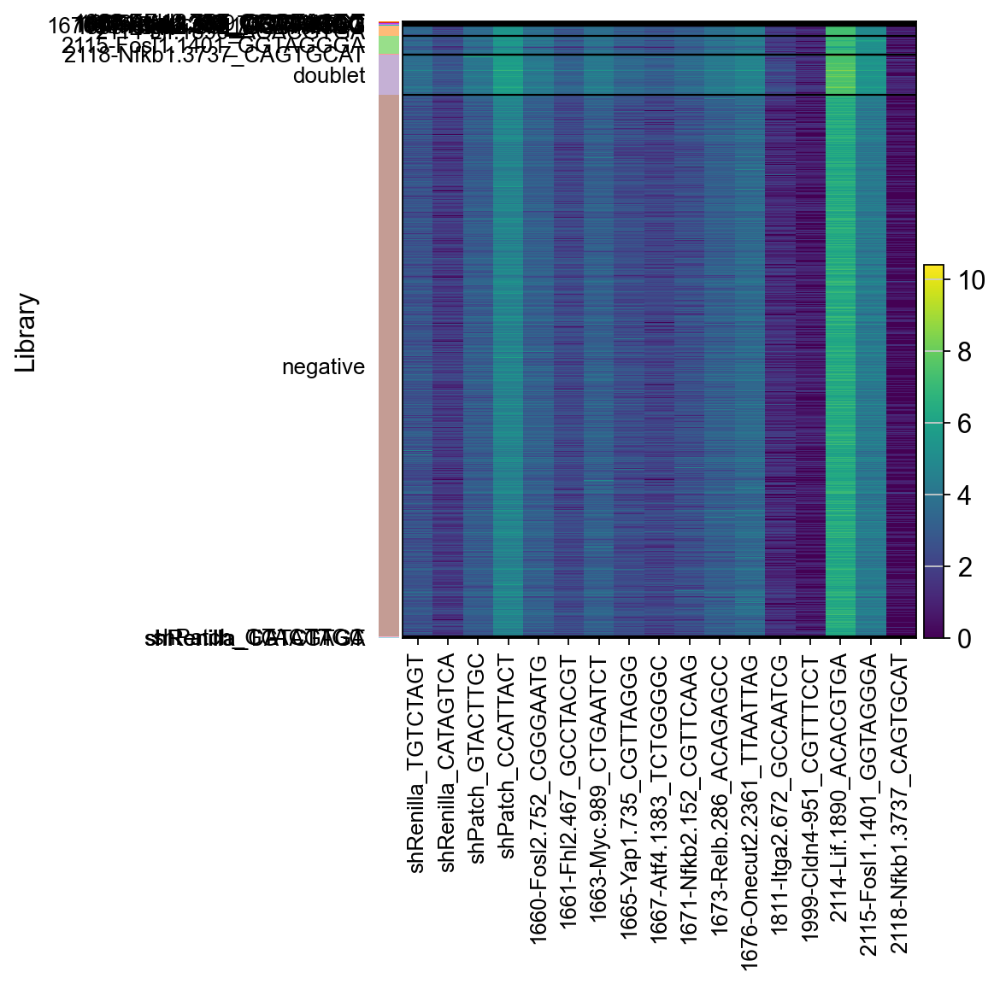

In [59]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched, adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

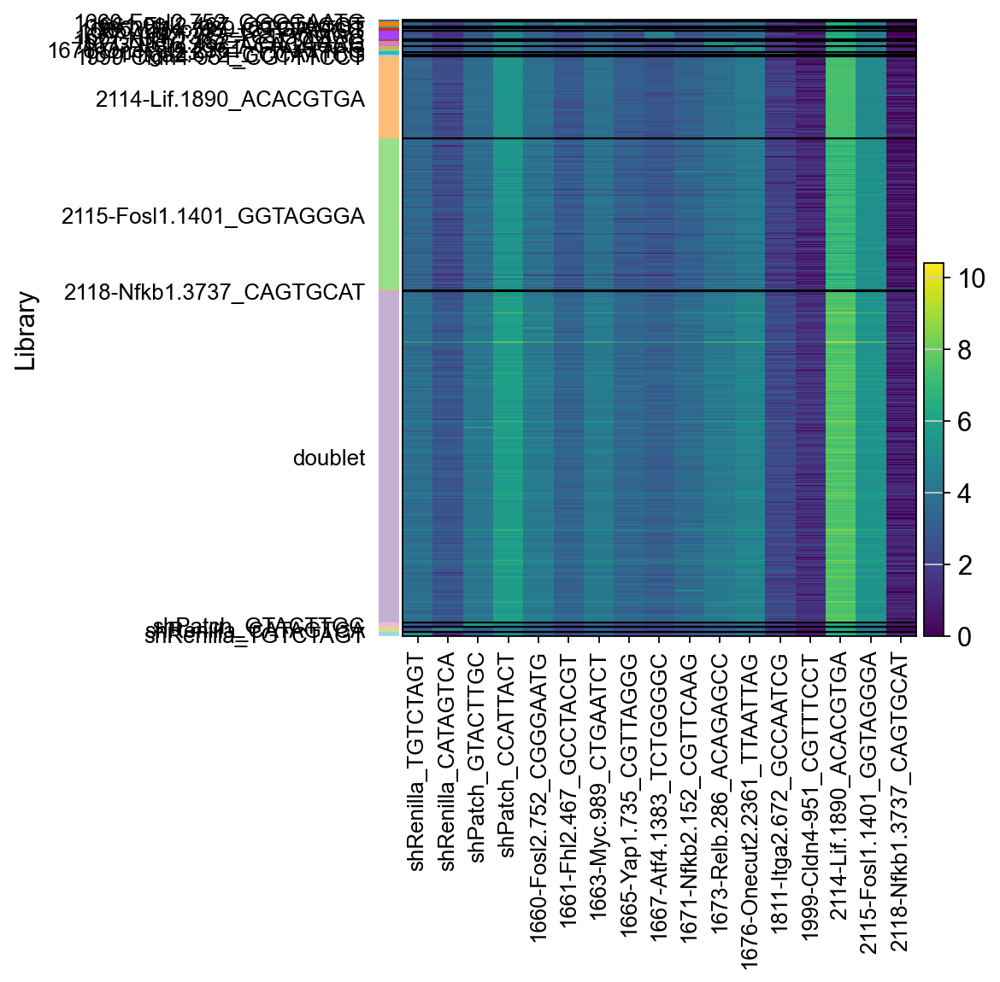

In [60]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched[~adata_enriched.obs.Library.isin(['negative']),:], adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

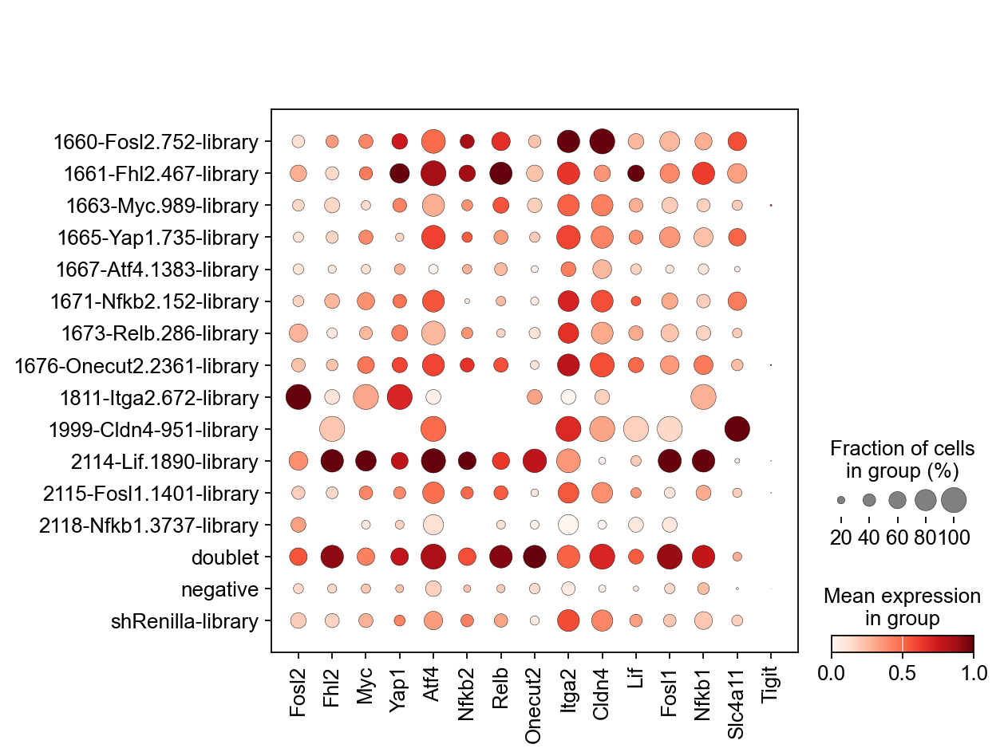

In [61]:
sc.pl.dotplot(adata, targetGenes, groupby='library_id', standard_scale='var')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

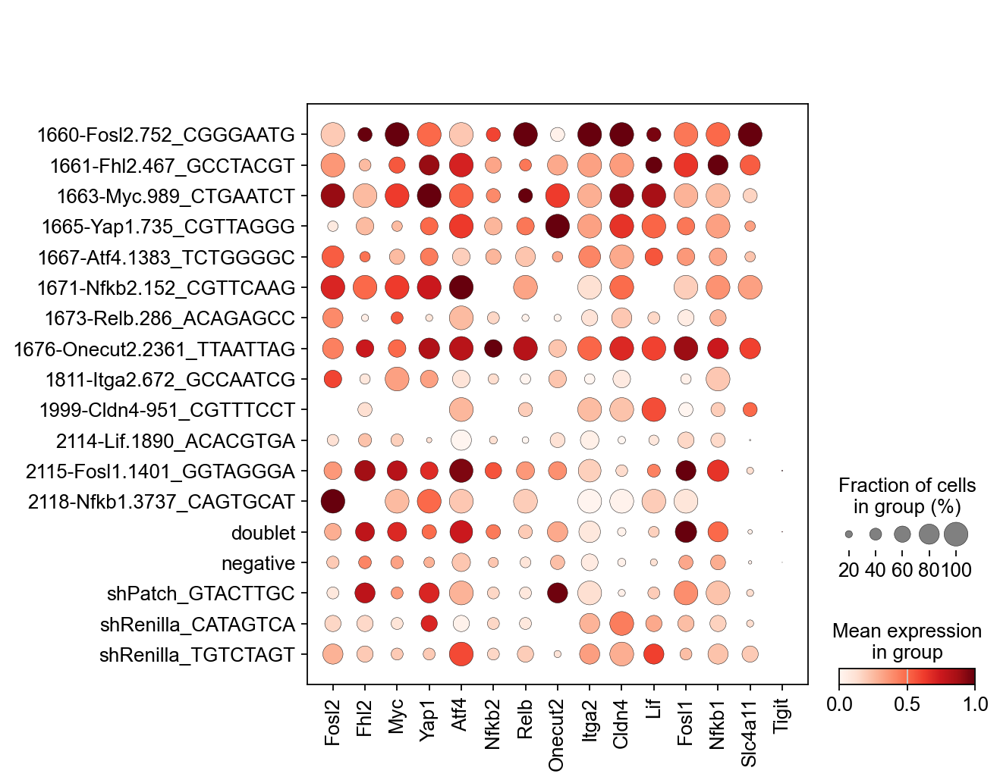

In [62]:
sc.pl.dotplot(adata, targetGenes, groupby='Library', standard_scale='var')

In [63]:
adata.obs.Library.value_counts()

Library
negative                      4776
doublet                        354
2115-Fosl1.1401_GGTAGGGA       162
2114-Lif.1890_ACACGTGA          88
1667-Atf4.1383_TCTGGGGC          9
1676-Onecut2.2361_TTAATTAG       6
shRenilla_TGTCTAGT               5
1661-Fhl2.467_GCCTACGT           5
1673-Relb.286_ACAGAGCC           5
shRenilla_CATAGTCA               5
shPatch_GTACTTGC                 5
1665-Yap1.735_CGTTAGGG           3
1811-Itga2.672_GCCAATCG          3
1660-Fosl2.752_CGGGAATG          2
1999-Cldn4-951_CGTTTCCT          2
1671-Nfkb2.152_CGTTCAAG          2
1663-Myc.989_CTGAATCT            2
2118-Nfkb1.3737_CAGTGCAT         1
Name: count, dtype: int64

In [64]:
adata.obs.library_id.value_counts()

library_id
negative                     6439
2114-Lif.1890-library        1100
2115-Fosl1.1401-library       121
1676-Onecut2.2361-library      56
1663-Myc.989-library           33
shRenilla-library              30
1673-Relb.286-library          29
1667-Atf4.1383-library         22
1671-Nfkb2.152-library         18
1660-Fosl2.752-library         15
1665-Yap1.735-library          13
doublet                         8
1661-Fhl2.467-library           7
2118-Nfkb1.3737-library         4
1811-Itga2.672-library          2
1999-Cldn4-951-library          1
Name: count, dtype: int64

In [65]:
import re
m = re.compile("(.+\-|negative|doublet)")

In [66]:
i=0
for x, y in adata.obs[['library_id', 'Library']].iterrows():
    print(y)
    i+=1
    if i == 1: 
        library_id,Library = y
        print(library_id[:-8])
        break

library_id    negative
Library        doublet
Name: AAACCCAAGCTGTTAC-1, dtype: object



In [67]:
classification = np.empty(len(adata), dtype="object")
i=0
import re
m1 = re.compile("(.+\-library|negative|doublet)")
m2 = re.compile("(.+\_)|negative|doublet")
for x,y in adata.obs[['library_id', 'Library']].iterrows():
    library_id,Library = y
    m1match = m1.match(library_id)
    if pd.isna(Library): 
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        classification[i] = m1match
    elif m1.match(library_id) and m2.match(Library):
        m2match = m2.match(Library)
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        if m2match.group(0)[-1] == "_":
            m2match = m2match.group(0)[:-1]
        else:
            m2match = m2match.group(0)
        if m1match == m2match:
            classification[i] = m1match
        elif m1match == 'doublet' or m2match == 'doublet':
            classification[i] = 'doublet'
        elif m1match == 'negative':
            classification[i] = m2match
        elif m2match == 'negative':
            classification[i] = m1match
        else:
            classification[i] = 'mismatch'
    i += 1
adata.obs['cLibrary'] = classification

In [68]:
adata.obs.cLibrary.value_counts()

cLibrary
negative             6109
2114-Lif.1890         959
doublet               362
2115-Fosl1.1401       171
mismatch               64
1676-Onecut2.2361      56
shRenilla              32
1673-Relb.286          30
1663-Myc.989           28
1667-Atf4.1383         24
1671-Nfkb2.152         17
1660-Fosl2.752         13
1665-Yap1.735          12
1661-Fhl2.467           9
shPatch                 5
2118-Nfkb1.3737         3
1999-Cldn4-951          2
1811-Itga2.672          2
Name: count, dtype: int64

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

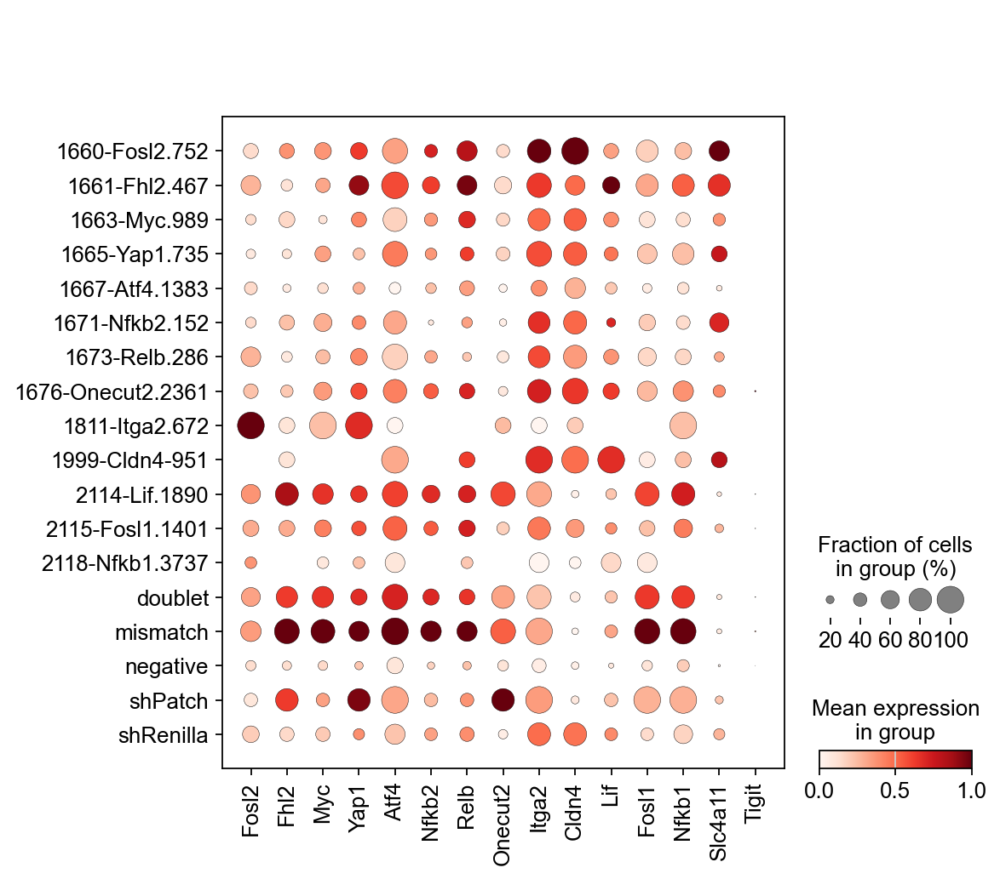

In [69]:
sc.pl.dotplot(adata, targetGenes, groupby='cLibrary', standard_scale='var')

## Set highly variable genes

In [70]:
adata = adata[~(adata.obs['Classification'].isin(['doublet','negative'])|adata.obs['library_id'].isin(['doublet'])),:]

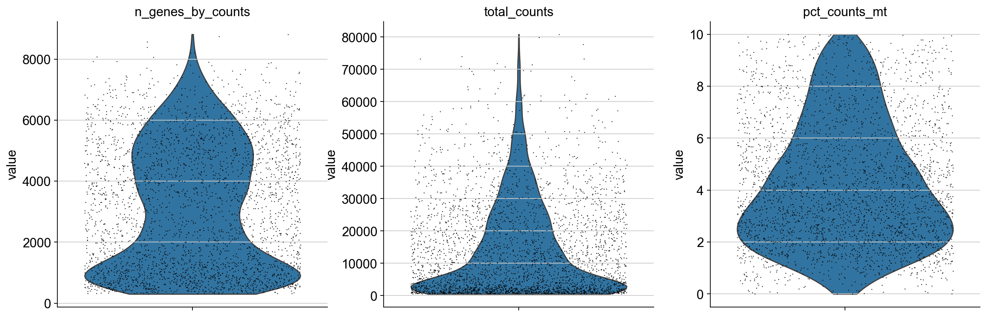

In [71]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

In [72]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [73]:
sc.pp.log1p(adata)

In [74]:
sc.pp.highly_variable_genes(adata) #batch_key=Classification

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


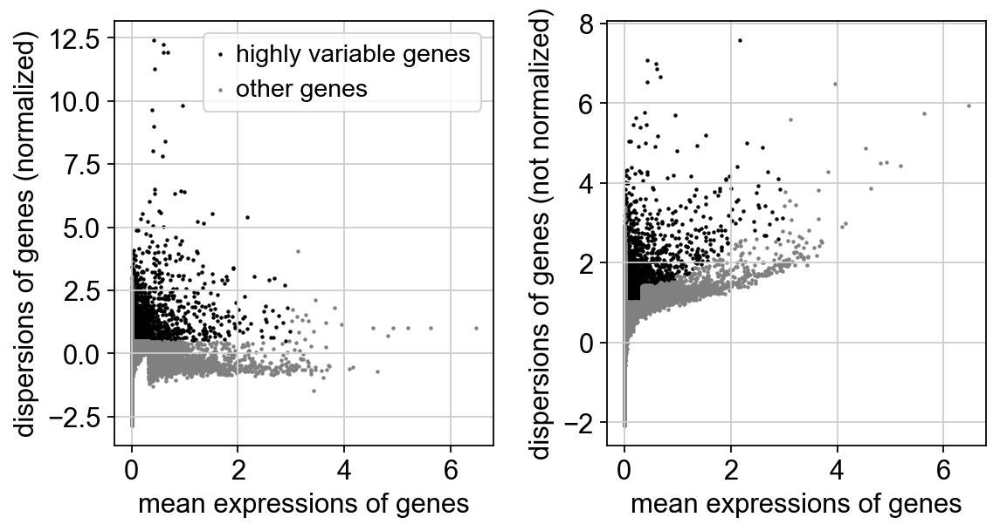

In [75]:
sc.pl.highly_variable_genes(adata)

In [76]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2494002

In [77]:
adata.obs['library_id'].value_counts()

library_id
negative                     2585
2114-Lif.1890-library         260
2115-Fosl1.1401-library        96
1676-Onecut2.2361-library      43
1673-Relb.286-library          26
shRenilla-library              25
1663-Myc.989-library           21
1660-Fosl2.752-library         13
1667-Atf4.1383-library         13
1665-Yap1.735-library          12
1671-Nfkb2.152-library         11
1661-Fhl2.467-library           7
2118-Nfkb1.3737-library         3
1811-Itga2.672-library          2
Name: count, dtype: int64

In [78]:
#Set shRNA groups
adata.obs['shRNA'] = None
for x in adata.obs["library_id"].cat.categories:
    if x == 'negative':continue
    adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2310838860.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x
/var/folders/xc/wjwqs2j55dqgp2ghrn6n

In [79]:
adata.obs[['Classification','shRNA']].value_counts()

Classification  shRNA                    
AQ1815_B0301    2114-Lif.1890-library        210
AR1166_B0305    2115-Fosl1.1401-library       37
AQ1815_B0301    2115-Fosl1.1401-library       36
                1673-Relb.286-library         21
AR1166_B0305    2114-Lif.1890-library         18
AQ1815_B0301    1676-Onecut2.2361-library     16
AQ1836_B0302    1676-Onecut2.2361-library     13
AP1694_B0306    2114-Lif.1890-library         12
AP1695_B0303    2115-Fosl1.1401-library       12
AQ1836_B0302    2114-Lif.1890-library         11
AP1695_B0303    shRenilla-library             11
                2114-Lif.1890-library          9
AQ1815_B0301    1663-Myc.989-library           9
                shRenilla-library              9
                1671-Nfkb2.152-library         9
                1660-Fosl2.752-library         8
AQ1836_B0302    1663-Myc.989-library           7
AP1694_B0306    1676-Onecut2.2361-library      7
AQ1836_B0302    2115-Fosl1.1401-library        7
AQ1815_B0301    1661-Fhl2.4

In [80]:
sum(adata.obs[['Classification','shRNA']].value_counts())

532

In [81]:
adata.raw = adata

In [82]:
adata.write('write/allmice-noSCT.h5ad', compression='gzip')

In [83]:
adata = sc.read('write/allmice-noSCT.h5ad')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [84]:
adata = adata[:, adata.var.highly_variable]

In [85]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:24)


In [86]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [87]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


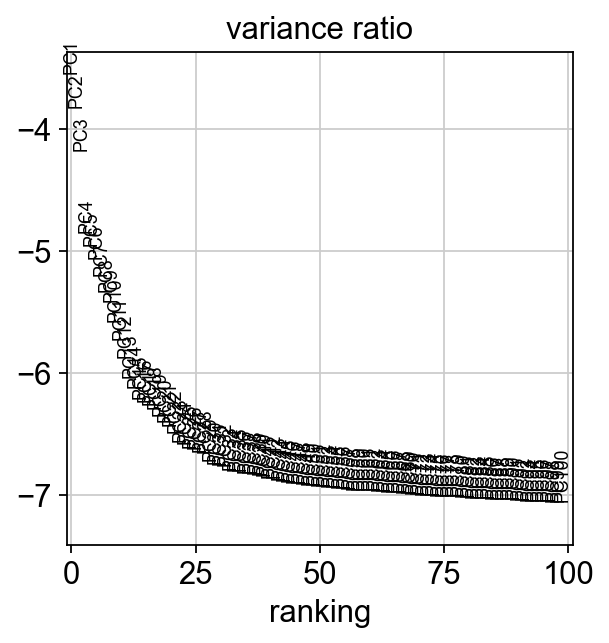

In [88]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

Save the result.

In [89]:
adata.write(results_file, compression='gzip')

In [90]:
adata

AnnData object with n_obs × n_vars = 3117 × 6482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [91]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


## Embedding the neighborhood graph

In [92]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


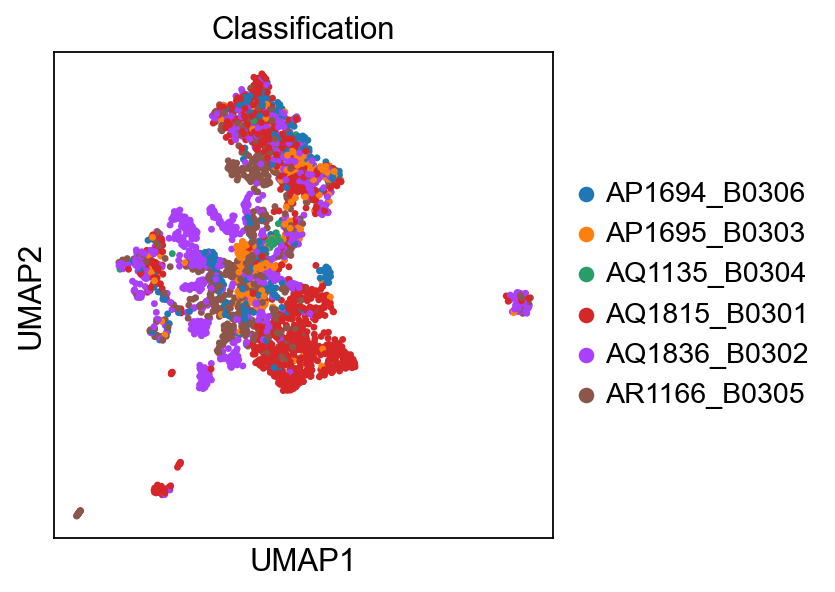

In [93]:
sc.pl.umap(adata, color=['Classification'])

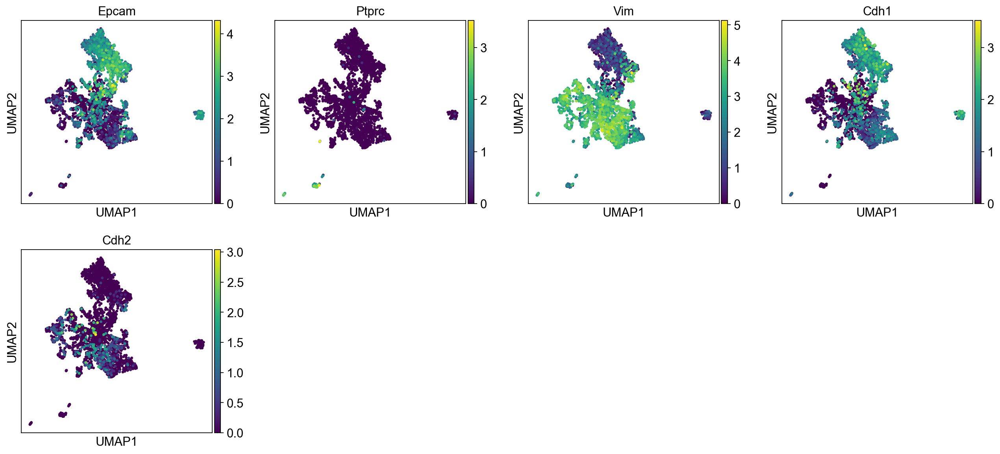

In [94]:
sc.pl.umap(adata, color=['Epcam', 'Ptprc','Vim', 'Cdh1','Cdh2'])

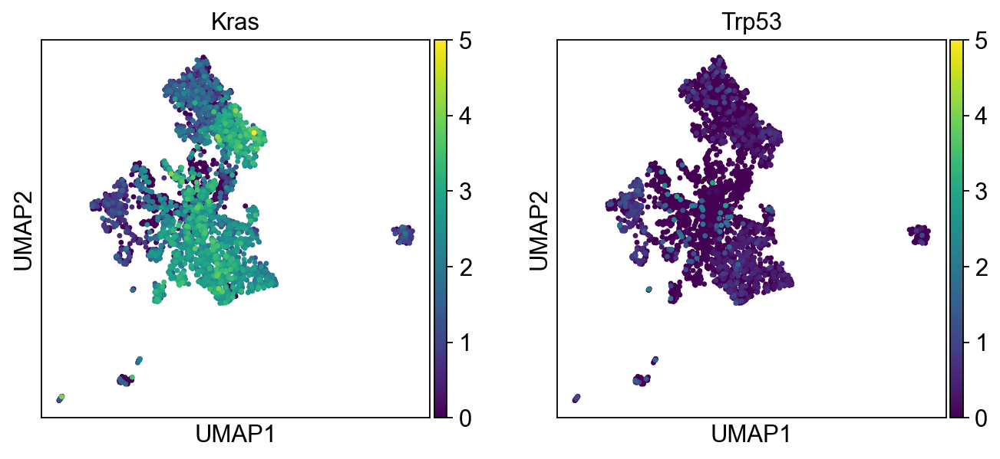

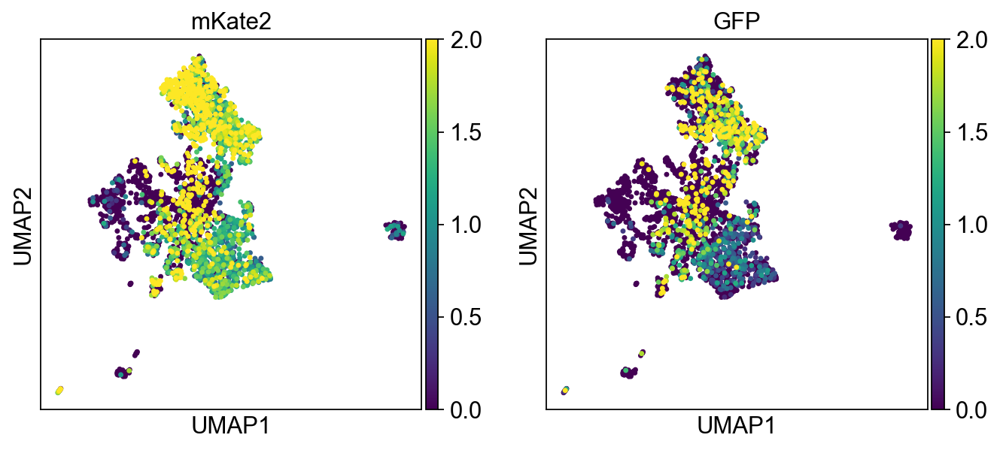

In [95]:
sc.pl.umap(adata, color=['Kras','Trp53'], vmax=5)
sc.pl.umap(adata, color=['mKate2','GFP'], vmax=2)

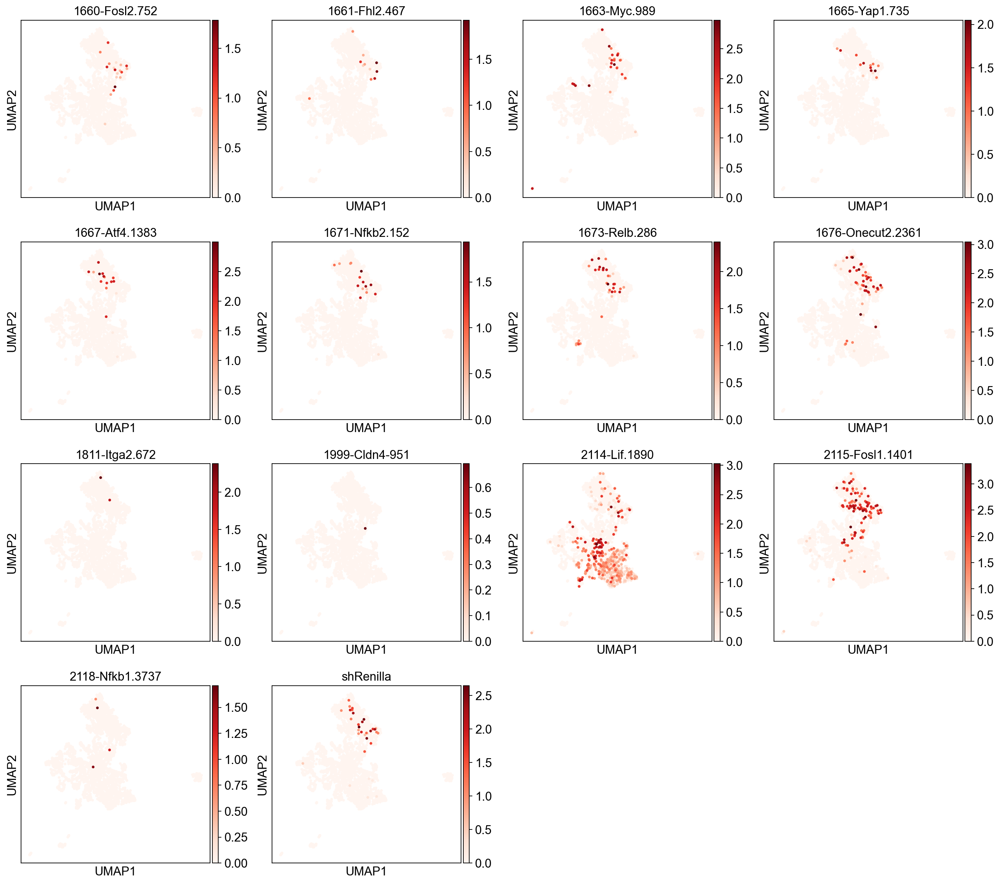

In [96]:
sc.pl.umap(adata, color=library, cmap='Reds')

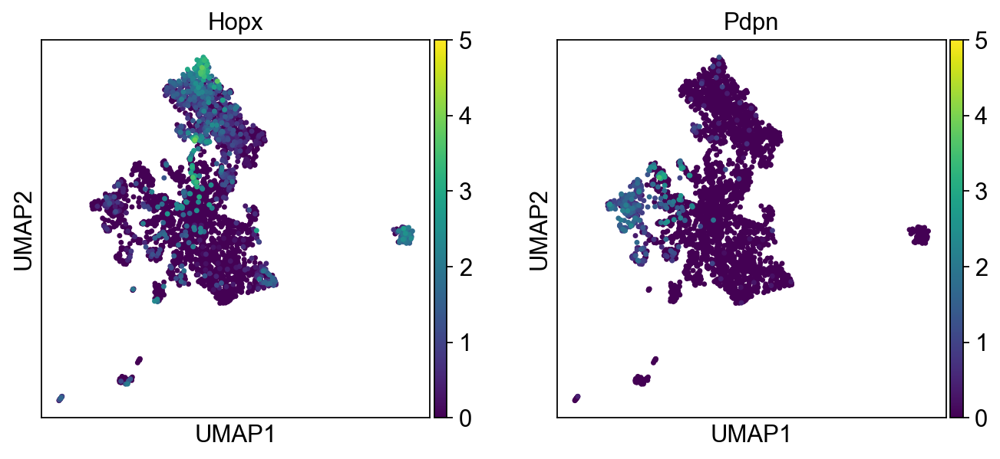

In [97]:
sc.pl.umap(adata, color=['Hopx','Pdpn'], vmax=5)

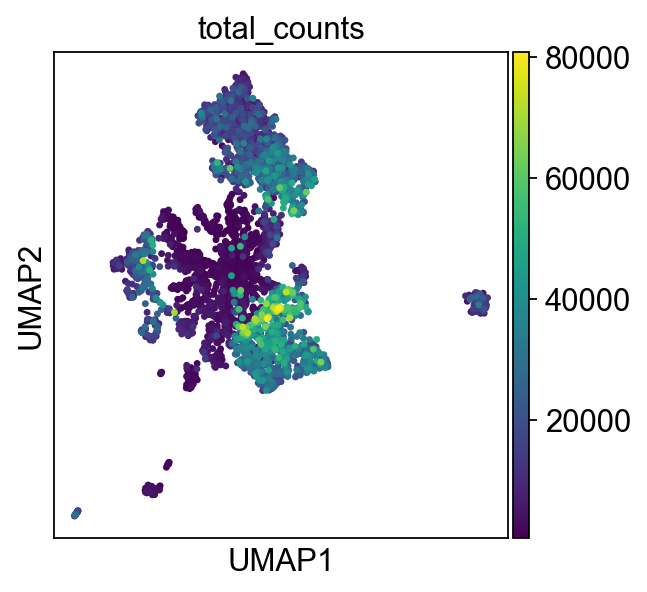

In [98]:
sc.pl.umap(adata, color=['total_counts'])

## Clustering the neighborhood graph

In [99]:
#sc.tl.leiden(adata, resolution=0.30)
sc.tl.leiden(adata, resolution=0.35)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


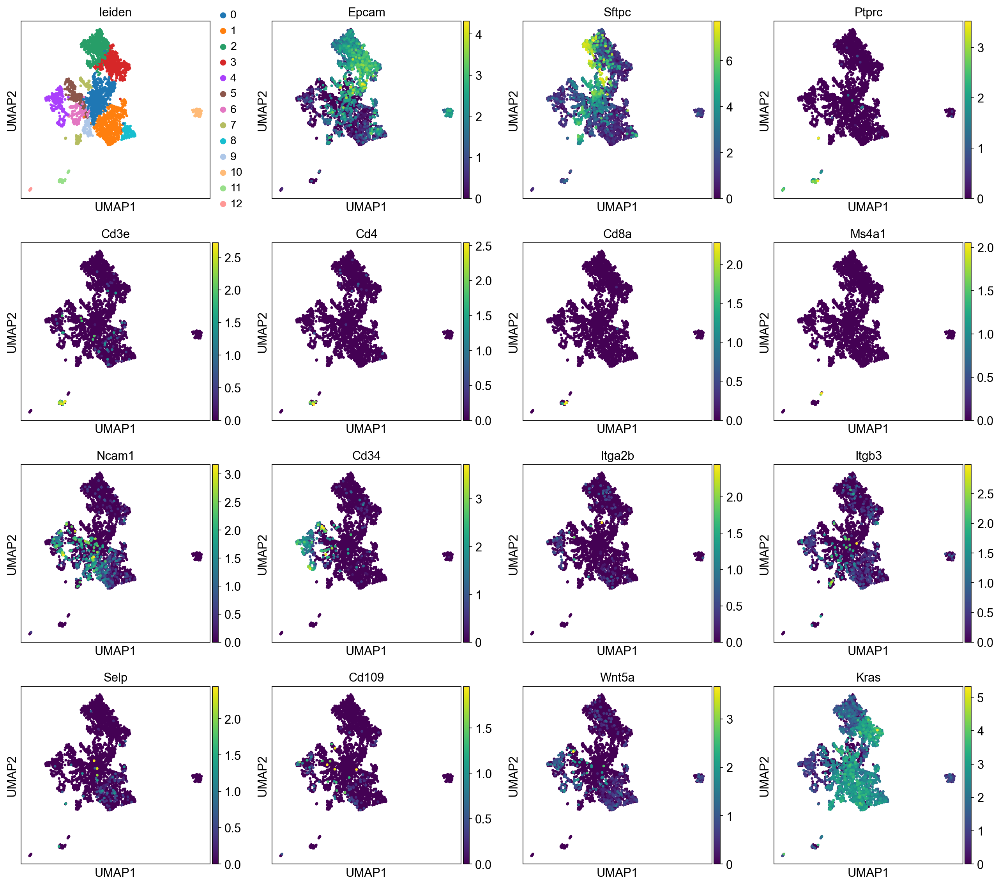

In [100]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                          'Ms4a1', #'Cd22', # B cell 'Cd19',
                         #'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1',# 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         #'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         #'Mcam', 'Vcam1', 'Pecam1', 'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

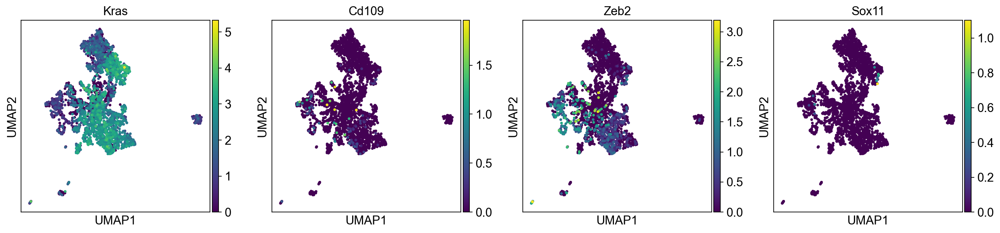

In [101]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

Save the result.

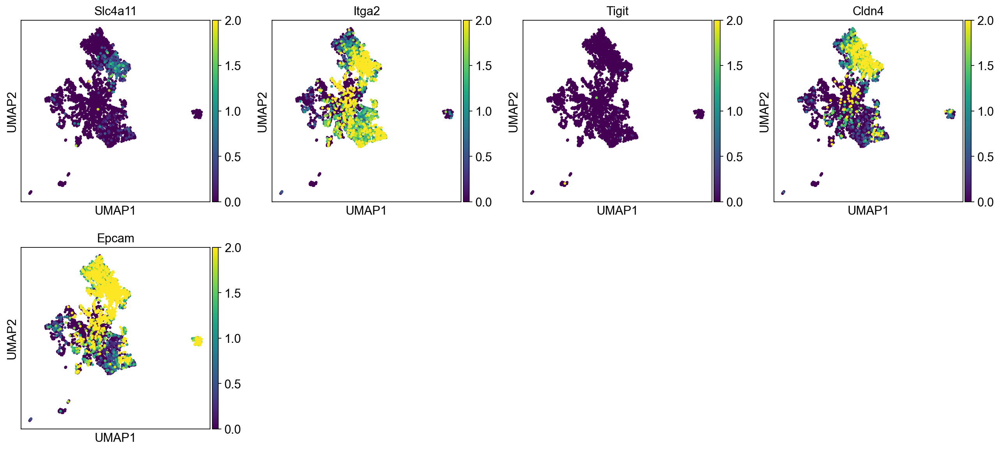

In [102]:
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Tigit', 'Cldn4','Epcam'], vmax=2)

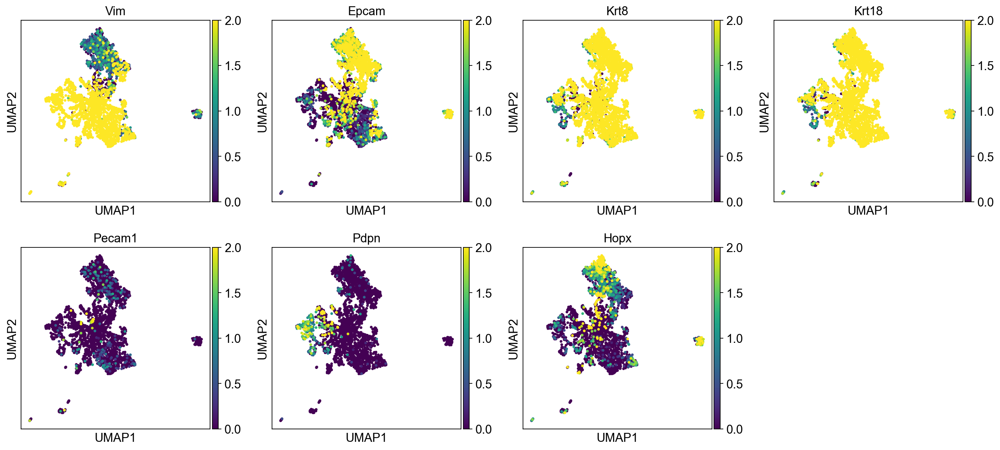

In [103]:
sc.pl.umap(adata, color=['Vim', 'Epcam', 'Krt8', 'Krt18','Pecam1', 'Pdpn', 'Hopx'], vmax=2)

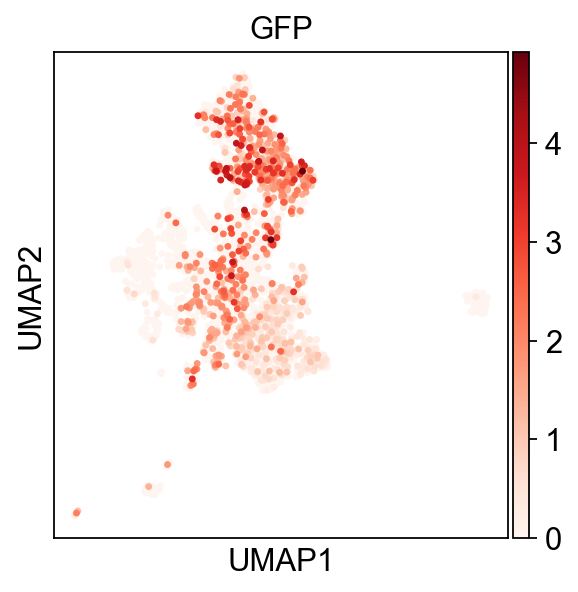

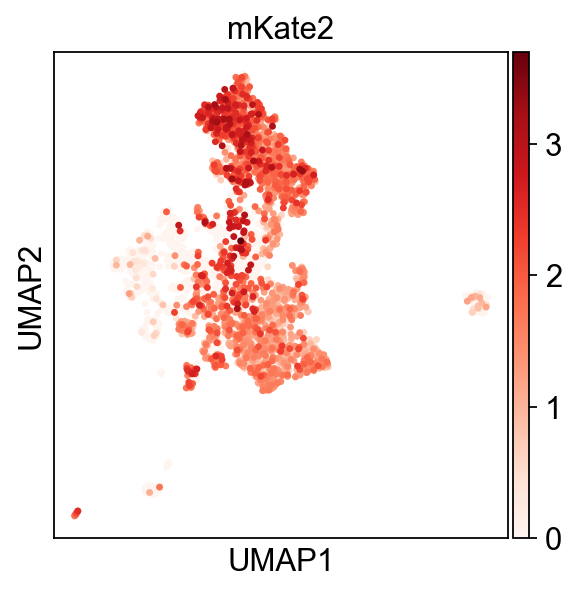

In [104]:
sc.pl.umap(adata, color=['GFP'], cmap='Reds')
sc.pl.umap(adata, color=['mKate2'], cmap='Reds')

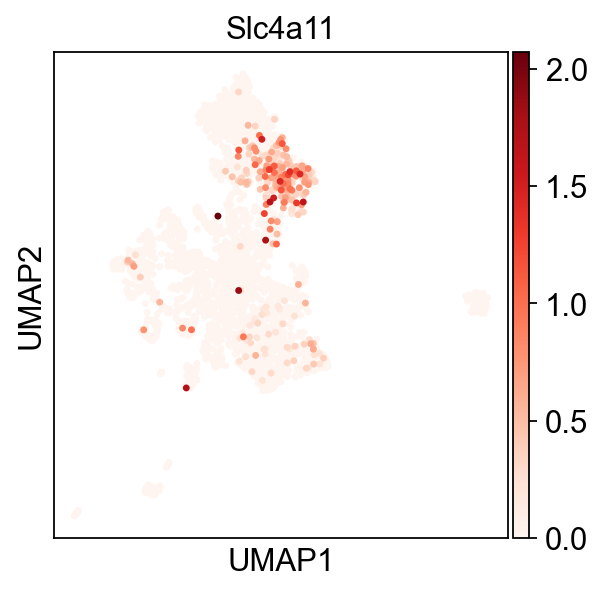

In [105]:
sc.pl.umap(adata, color=['Slc4a11'], cmap='Reds')

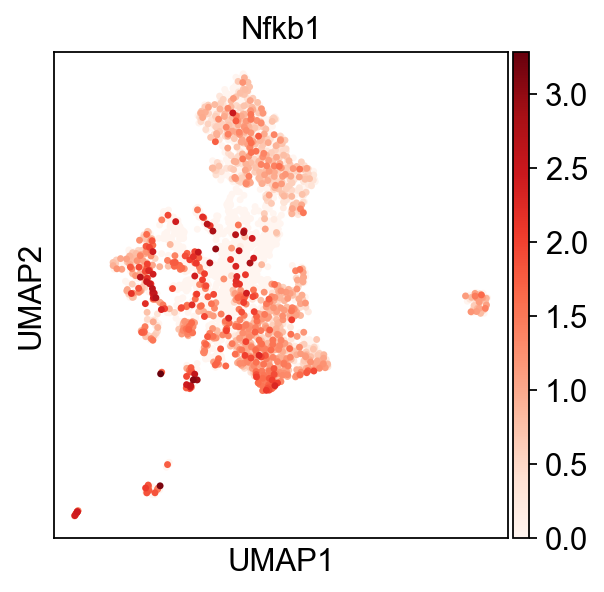

In [106]:
sc.pl.umap(adata, color=['Nfkb1'], cmap='Reds')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


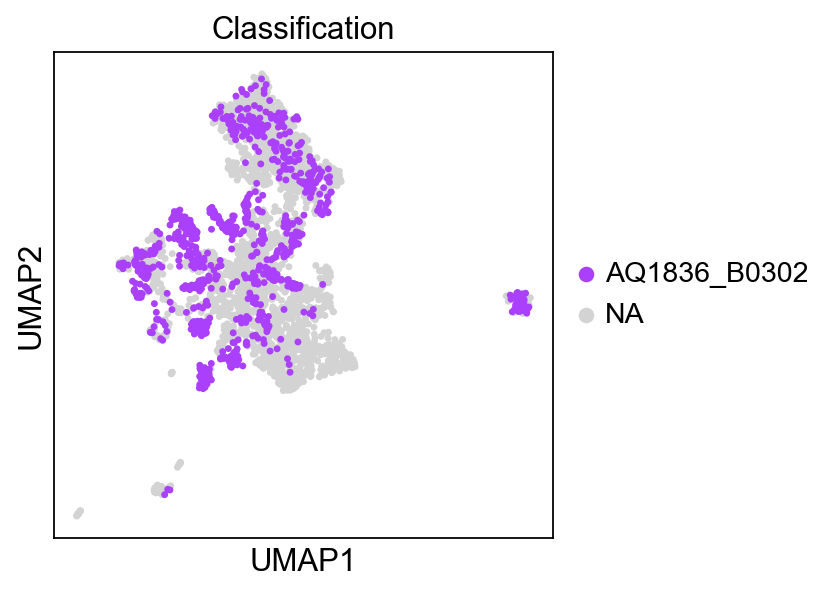

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


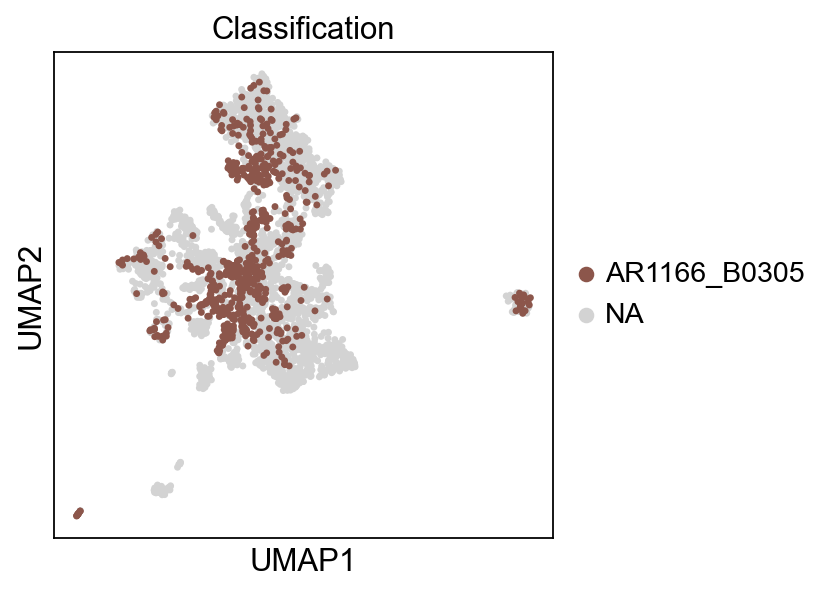

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


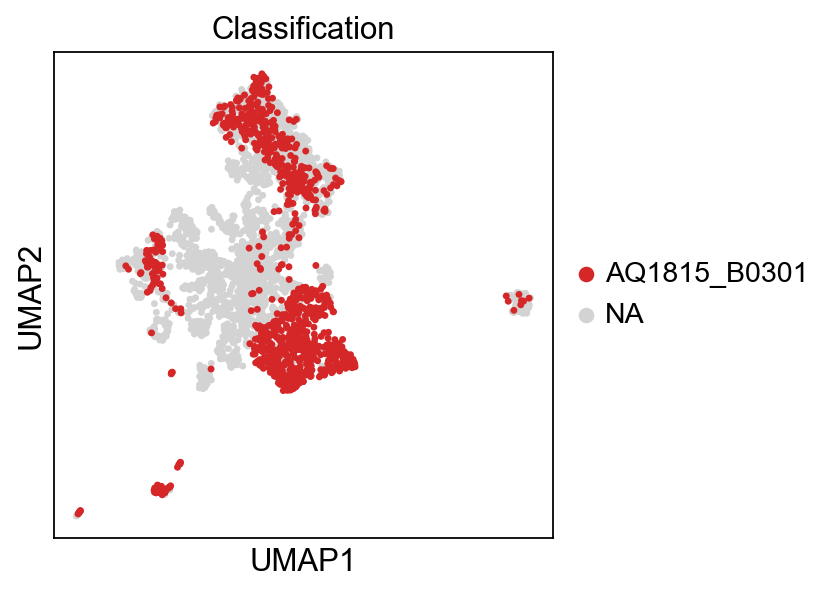

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


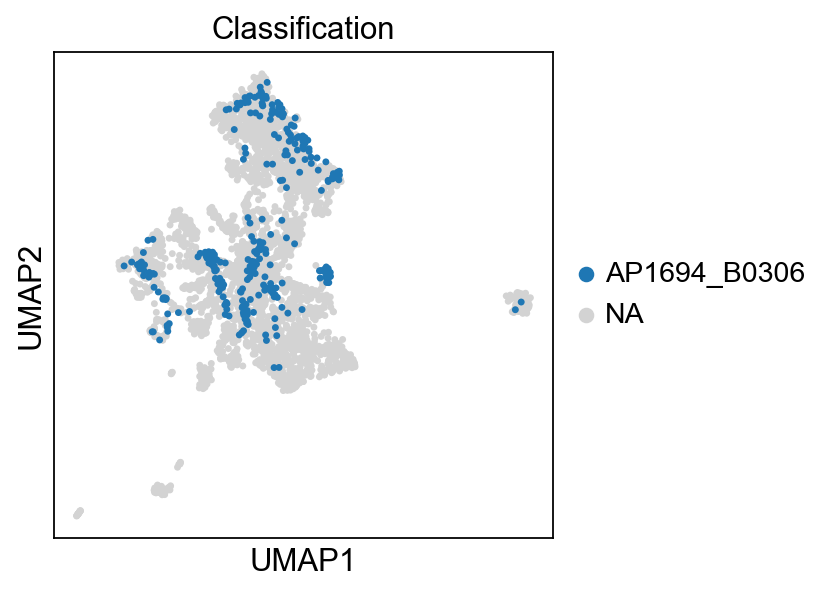

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


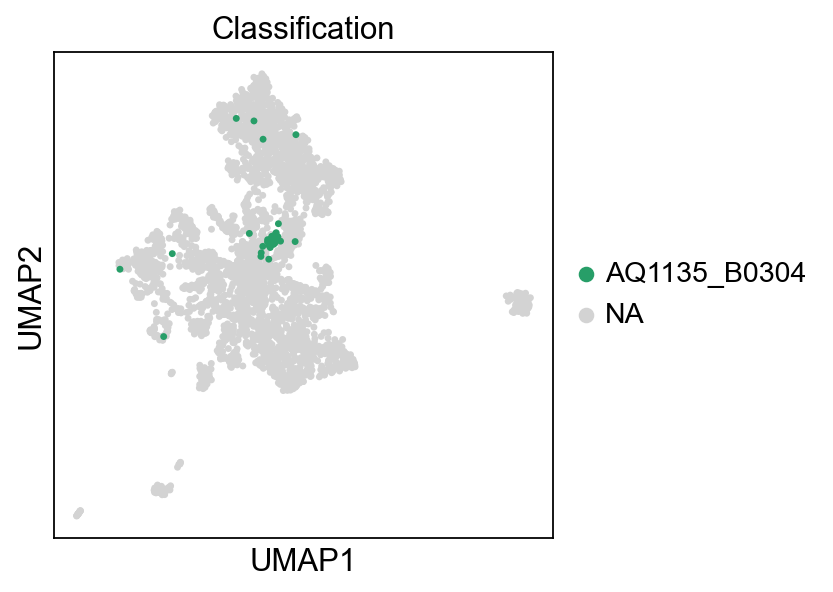

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


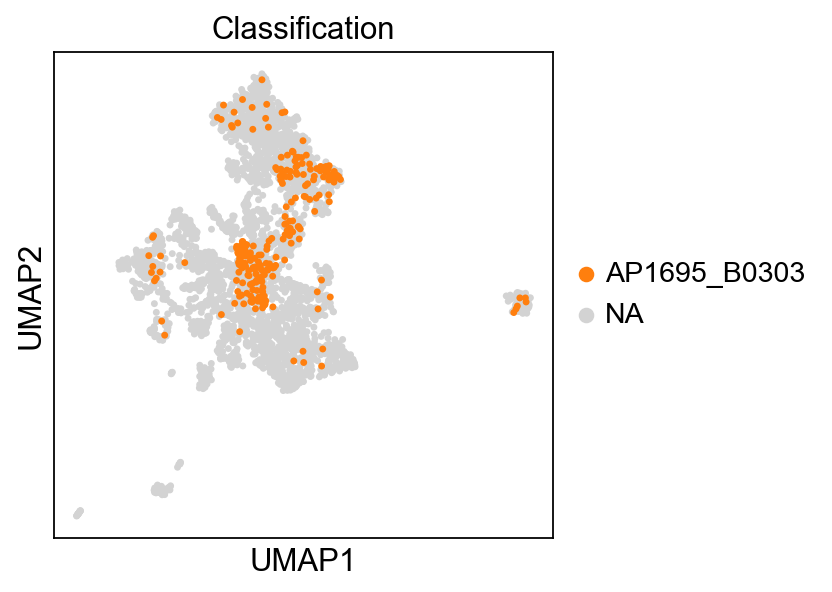

In [107]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [108]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [109]:
adata.obs.keys()

Index(['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI', 'Classification',
       '1660-Fosl2.752-library', '1661-Fhl2.467-library',
       '1663-Myc.989-library', '1665-Yap1.735-library',
       '1667-Atf4.1383-library', '1671-Nfkb2.152-library',
       '1673-Relb.286-library', '1676-Onecut2.2361-library',
       '1811-Itga2.672-library', '1999-Cldn4-951-library',
       '2114-Lif.1890-library', '2115-Fosl1.1401-library',
       '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count',
       'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'],
      dtype='object')

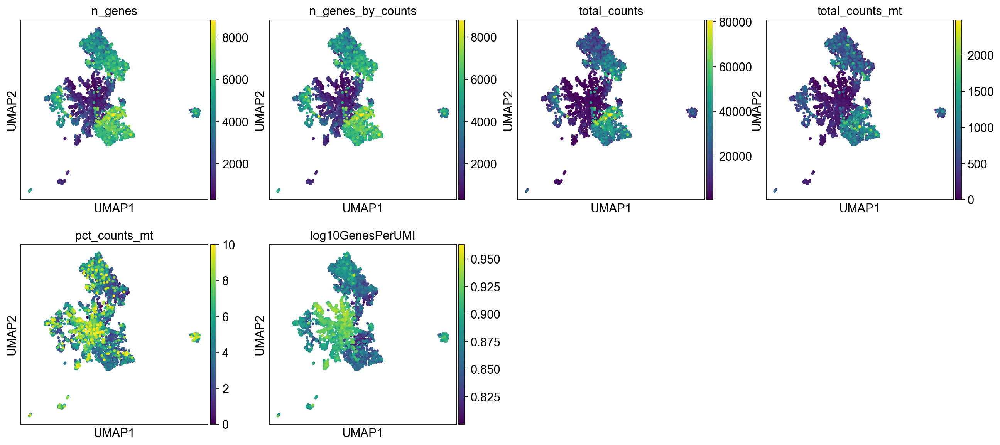

In [110]:
sc.pl.umap(adata,color=['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI'])

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


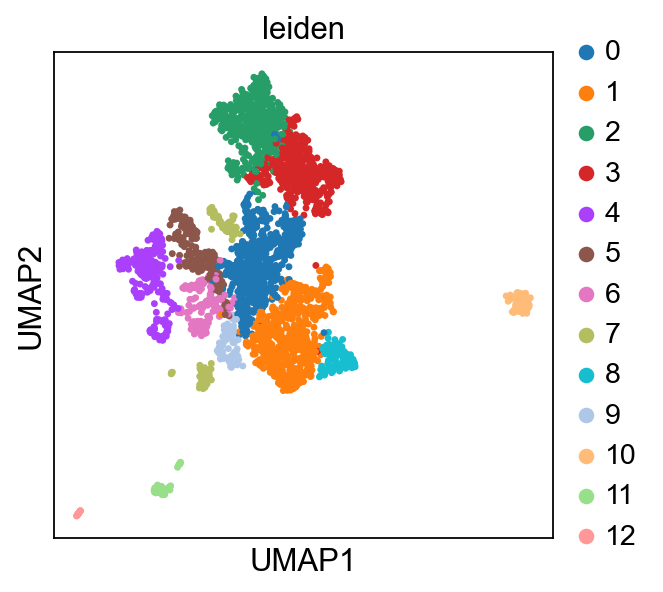

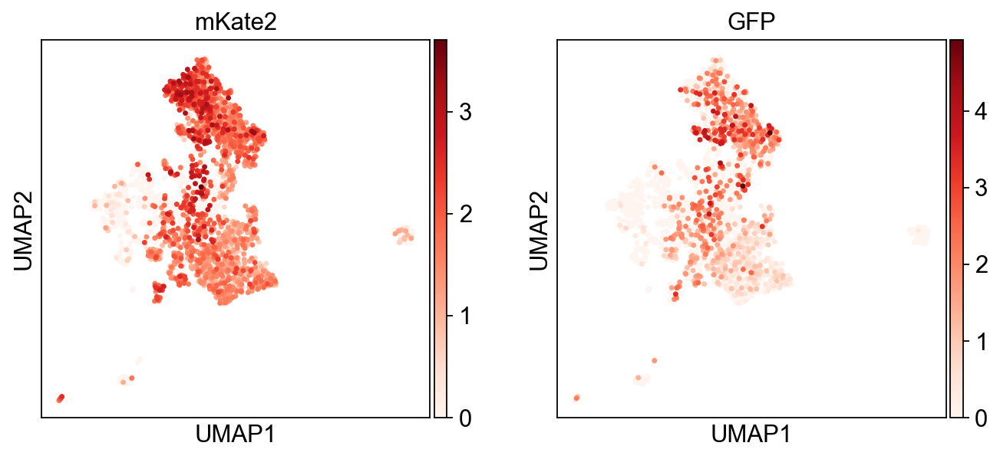

In [111]:
sc.pl.umap(adata,color='leiden')
sc.pl.umap(adata, color=['mKate2','GFP'], cmap='Reds')

In [112]:
adata

AnnData object with n_obs × n_vars = 3117 × 6482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'dis

In [113]:
adata[adata.obs.leiden.isin(['0','1','2','3','5','6','7','8','9']),:]

View of AnnData object with n_obs × n_vars = 2757 × 6482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    ob

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


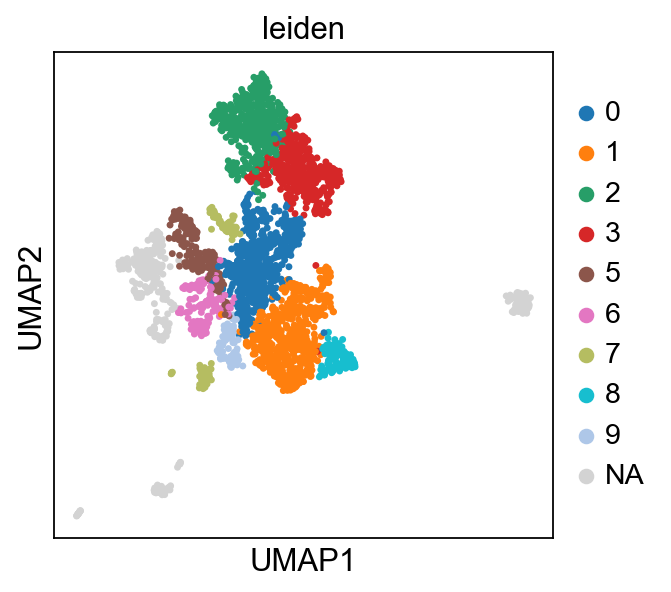

In [114]:
sc.pl.umap(adata, color=['leiden'], groups=['0','1','2','3','5','6','7','8','9']) # cluster 3 seems to be fibroblasts

## Select Tumor Cells

In [115]:
# Select only those subset of cells that are useful
adata2 = sc.read('write/allmice-noSCT.h5ad')
adata = adata2[adata.obs['leiden'].isin(['0','1','2','3','5','6','7','8','9']),:] # remove fibroblast cells
del adata2

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [116]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [117]:
sc.pp.highly_variable_genes(adata)#, batch_key='Classification')

extracting highly variable genes


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [118]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_90872/2494002

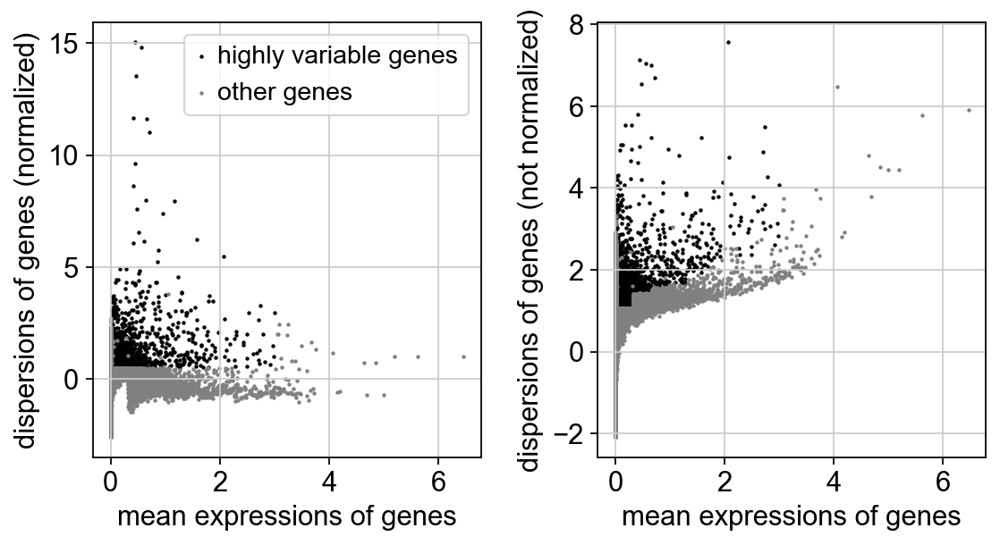

In [119]:
sc.pl.highly_variable_genes(adata)

In [120]:
adata.raw = adata

In [121]:
adata.write('write/allmice-tumornoSCT.h5ad', compression='gzip')
#adata = sc.read('write/allmice-tumornoSCT.h5ad')